Task list:
* metti qua e la gc collectors per liberare memoria

* Inizia ad allenare modelli più complessi con ordine per capire meglio

* vedi differenza nelle funzioni di split del dataset

* **vedi lezione ottimizzazione parametri**

* vedi github twitter challenge

* **cosa vuol dire exclude seen nell'evaluator**

IMPORTANT:

* **vedi cross validation**
* vedi se necessario evaluation test nella ricerca di hyperpaeameters
* **grande improvement su top pop escludendo quelli già visti**, pensa ad un ibrido che usa top pop poiché le prestazioni sono buone (guarda parametri della funzione recommend)
* usa la compute score per vedere se si può creare una nuova URM piu densa. Questo permette di usare SVD che è meno scalabile e lavora bene con matrici dense.
* **do different notebook for each model to ease execution**, add the inspection of the bayesian search result
* models may be combined looking at their values on user coverage or other performance measures.
* **USE GOOGLE COUD**
* first part (ICM method) is used to understand if the ICM data is going to be useful
* pick the useful one and change the hybrid so that it can cosider all the ICM and tune even the weight of the ICMs

## Import

In [1]:
from Data_manager.DataSplitter_leave_k_out import DataSplitter_leave_k_out
from Data_manager.split_functions.split_train_validation_random_holdout import split_train_in_two_percentage_global_sample

from Recommenders.Incremental_Training_Early_Stopping import Incremental_Training_Early_Stopping
from Recommenders.Recommender_import_list import *

from Evaluation.Evaluator import EvaluatorHoldout


Tensorflow is not available


In [2]:
import traceback
import os
import time

import scipy
import numpy as np
import pandas as pd
import scipy.sparse as sps

import matplotlib.pyplot as plt

from pandas_profiling import ProfileReport

In [3]:
## Optimization libraries
from skopt.space import Real, Integer, Categorical

In [4]:
## Set the numpy random seed
SEED = 42
np.random.seed(SEED)

In [5]:
## Allow more than one output for a single code cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

## Data Loading and Analysis

In [6]:
!ls ./Dataset/*.csv

./Dataset/alg_sample_submission.csv  ./Dataset/data_ICM_subgenre.csv
./Dataset/data_ICM_channel.csv	     ./Dataset/data_target_users_test.csv
./Dataset/data_ICM_event.csv	     ./Dataset/data_train.csv
./Dataset/data_ICM_genre.csv


In [7]:
data_file_path = "./Dataset"

URM_path = os.path.join(data_file_path, "data_train.csv")

ICM_channel_path = os.path.join(data_file_path, "data_ICM_channel.csv")
ICM_event_path = os.path.join(data_file_path, "data_ICM_event.csv")
ICM_genre_path = os.path.join(data_file_path, "data_ICM_genre.csv")
ICM_subgenre_path = os.path.join(data_file_path, "data_ICM_subgenre.csv")

### Load URM

In [88]:
URM_all_dataframe = pd.read_csv(filepath_or_buffer=URM_path, 
                                sep=",",
                                dtype={0:int, 1:int, 2:int},
                                engine='python')

URM_all_dataframe.columns = ["UserID", "ItemID", "Interaction"]

In [9]:
URM_all_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5285664 entries, 0 to 5285663
Data columns (total 3 columns):
 #   Column       Dtype
---  ------       -----
 0   UserID       int64
 1   ItemID       int64
 2   Interaction  int64
dtypes: int64(3)
memory usage: 121.0 MB


In [10]:
URM_all_dataframe.head(10)

,UserID,ItemID,Interaction
0,0,53,1
1,0,209,1
2,0,223,1
3,0,249,1
4,0,435,1
5,0,460,1
6,0,652,1
7,0,960,1
8,0,973,1
9,0,1103,1


In [11]:
URM_all_dataframe.nunique()

UserID         13650
ItemID         18059
Interaction        1
dtype: int64

In [12]:
len(URM_all_dataframe.UserID)

5285664

In [13]:
len(URM_all_dataframe.ItemID)

5285664

In [14]:
sparsity = '{:.6%}'.format(len(URM_all_dataframe) / (URM_all_dataframe.UserID.nunique() * URM_all_dataframe.ItemID.nunique()))
print('This is an estimate of the sparsity of the URM: ', sparsity) 

This is an estimate of the sparsity of the URM:  2.144239%


In [23]:
profile = ProfileReport(URM_all_dataframe, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


There are no duplicates or missing cells. Most importantly (since we expected a clead dataset) we have a histogram that show us the distribution of the *UserID*, and *ItemID*, and we can notice that the distribution is pretty even.

### Load ICM

#### ICM Genre

In [15]:
ICM_genre_dataframe = pd.read_csv(filepath_or_buffer=ICM_genre_path, 
                            sep=",", 
                            dtype={0:int, 1:int, 2:int},
                            engine='python')

ICM_genre_dataframe.columns = ["ItemID", "GenreID", "Feature"]

In [16]:
ICM_genre_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17991 entries, 0 to 17990
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   ItemID   17991 non-null  int64
 1   GenreID  17991 non-null  int64
 2   Feature  17991 non-null  int64
dtypes: int64(3)
memory usage: 421.8 KB


In [17]:
ICM_genre_dataframe.head(20)

,ItemID,GenreID,Feature
0,0,3,1
1,1,3,1
2,2,6,1
3,3,0,1
4,3,1,1
5,4,4,1
6,5,3,1
7,6,7,1
8,7,6,1
9,8,4,1


In [18]:
ICM_genre_dataframe.nunique()

ItemID     17500
GenreID        8
Feature        1
dtype: int64

In [19]:
print('ICM genre items number: ', len(ICM_genre_dataframe.ItemID.unique()))
print('URM items number: ', URM_all_dataframe.ItemID.nunique())

missing = list(set(ICM_genre_dataframe.ItemID.unique()) - set(URM_all_dataframe.ItemID.unique()))
print('Missing items in ICM from URM: ', missing)

ICM genre items number:  17500
URM items number:  18059
Missing items in ICM from URM:  []


In [20]:
print('This is the number of items that has more than one genre: ', len(ICM_genre_dataframe) - ICM_genre_dataframe.ItemID.nunique()) 

This is the number of items that has more than one genre:  491


In [21]:
sparsity = '{:.6%}'.format(len(ICM_genre_dataframe) / (ICM_genre_dataframe.ItemID.nunique() * ICM_genre_dataframe.GenreID.nunique()))
print('This is an estimate of the sparsity of the ICM genre: ', sparsity) 

This is an estimate of the sparsity of the ICM genre:  12.850714%


In [22]:
profile = ProfileReport(ICM_genre_dataframe, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


There are no duplicates or missing cells. Most importantly (since we expected a clead dataset) we have a histogram that show us the distribution of the *ItemID*, and *GenreID*, and we can notice that the distribution of the *ItemID* is pretty even, instead the distribution of the *GenreID* is not evenly distributed accross the different genres.

#### ICM Subgenre

In [23]:
ICM_subgenre_dataframe = pd.read_csv(filepath_or_buffer=ICM_subgenre_path, 
                            sep=",", 
                            dtype={0:int, 1:int, 2:int},
                            engine='python')

ICM_subgenre_dataframe.columns = ["ItemID", "SubgenreID", "Feature"]

In [24]:
ICM_subgenre_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18057 entries, 0 to 18056
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   ItemID      18057 non-null  int64
 1   SubgenreID  18057 non-null  int64
 2   Feature     18057 non-null  int64
dtypes: int64(3)
memory usage: 423.3 KB


In [25]:
ICM_subgenre_dataframe.head(10)

,ItemID,SubgenreID,Feature
0,0,70,1
1,1,27,1
2,2,40,1
3,3,50,1
4,4,62,1
5,5,3,1
6,6,99,1
7,7,102,1
8,8,62,1
9,9,61,1


In [26]:
ICM_subgenre_dataframe.nunique()

ItemID        17572
SubgenreID      113
Feature           1
dtype: int64

In [27]:
print('ICM subgenre items number: ', len(ICM_subgenre_dataframe.ItemID.unique()))
print('URM items number: ', URM_all_dataframe.ItemID.nunique())

missing = list(set(ICM_subgenre_dataframe.ItemID.unique()) - set(URM_all_dataframe.ItemID.unique()))
print('Missing items in ICM from URM: ', missing)

ICM subgenre items number:  17572
URM items number:  18059
Missing items in ICM from URM:  []


In [28]:
print('This is the number of items that has more than one genre: ', len(ICM_subgenre_dataframe) - ICM_subgenre_dataframe.ItemID.nunique()) 

This is the number of items that has more than one genre:  485


In [29]:
sparsity = '{:.6%}'.format(len(ICM_subgenre_dataframe) / (ICM_subgenre_dataframe.ItemID.nunique() * ICM_subgenre_dataframe.SubgenreID.nunique()))
print('This is an estimate of the sparsity of the ICM genre: ', sparsity) 

This is an estimate of the sparsity of the ICM genre:  0.909381%


In [74]:
profile = ProfileReport(ICM_subgenre_dataframe, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]


There are no duplicates or missing cells. Most importantly (since we expected a clead dataset) we have a histogram that show us the distribution of the *ItemID*, and *SubgenreID*, and we can notice that the distribution of the *ItemID* is pretty even, instead the distribution of the *SubgenreID* is not evenly distributed accross the different subgenres.

#### ICM Event

In [30]:
ICM_event_dataframe = pd.read_csv(filepath_or_buffer=ICM_event_path, 
                            sep=",", 
                            dtype={0:int, 1:int, 2:int},
                            engine='python')

ICM_event_dataframe.columns = ["ItemID", "EventID", "Feature"]

In [31]:
ICM_event_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 358070 entries, 0 to 358069
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   ItemID   358070 non-null  int64
 1   EventID  358070 non-null  int64
 2   Feature  358070 non-null  int64
dtypes: int64(3)
memory usage: 8.2 MB


In [32]:
ICM_event_dataframe.head(10)

,ItemID,EventID,Feature
0,0,121781,1
1,1,150102,1
2,1,349614,1
3,2,9174,1
4,2,20833,1
5,2,251794,1
6,3,81458,1
7,4,84041,1
8,5,7823,1
9,5,50941,1


In [33]:
ICM_event_dataframe.nunique()

ItemID      17967
EventID    347825
Feature         1
dtype: int64

The idea is to aggregate the information contained in this table: since each EventID represent a different episode, we may want to extract the information about the number of episodes the TV series has. To do that we must aggregate the values over the ItemID value and then consider the EventID as the number of episodes.

In [34]:
df = ICM_event_dataframe.groupby(['ItemID']).count()
df = df.reset_index()
df.Feature = 1

df.info() # the length must be equal to the number of the UNIQUE items in the ICM matrix
df.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17967 entries, 0 to 17966
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   ItemID   17967 non-null  int64
 1   EventID  17967 non-null  int64
 2   Feature  17967 non-null  int64
dtypes: int64(3)
memory usage: 421.2 KB


,ItemID,EventID,Feature
0,0,1,1
1,1,2,1
2,2,3,1
3,3,1,1
4,4,1,1
5,5,4,1
6,6,27,1
7,7,50,1
8,8,1,1
9,9,3,1


In [35]:
ICM_event_dataframe = df

In [36]:
ICM_event_dataframe.head(10)

,ItemID,EventID,Feature
0,0,1,1
1,1,2,1
2,2,3,1
3,3,1,1
4,4,1,1
5,5,4,1
6,6,27,1
7,7,50,1
8,8,1,1
9,9,3,1


In [37]:
ICM_event_dataframe.nunique()

ItemID     17967
EventID      435
Feature        1
dtype: int64

In [38]:
print('ICM events items number: ', len(ICM_event_dataframe.ItemID.unique()))
print('URM items number: ', URM_all_dataframe.ItemID.nunique())

missing = list(set(ICM_event_dataframe.ItemID.unique()) - set(URM_all_dataframe.ItemID.unique()))
print('Missing items in ICM from URM: ', missing)

ICM events items number:  17967
URM items number:  18059
Missing items in ICM from URM:  []


In [39]:
sparsity = '{:.6%}'.format(1 - len(ICM_event_dataframe) / (ICM_subgenre_dataframe.ItemID.nunique() * ICM_event_dataframe.EventID.nunique()))
print('This is an estimate of the sparsity of the ICM genre: ', sparsity) 

This is an estimate of the sparsity of the ICM genre:  0.235053%


In [225]:
profile = ProfileReport(ICM_event_dataframe, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Toggle the details of the EventID distribution to see the 'Common values' tab: it shows clearly how the frequency of the value is distributed among the items.


* These consideration are done over the non processed event matrix: There are no duplicates or missing cells. Most importantly (since we expected a clean dataset) we have a histogram that show us the distribution of the *ItemID*, and *EventID*, and we can notice that the distribution of the *EventID* is even (**Uniform**), instead the distribution of the *ItemID* is not evenly distributed accross the different *EventIDs*.

#### ICM Channel

In [40]:
ICM_channel_dataframe = pd.read_csv(filepath_or_buffer=ICM_channel_path, 
                            sep=",", 
                            dtype={0:int, 1:int, 2:int},
                            engine='python')

ICM_channel_dataframe.columns = ["ItemID", "ChannelID", "Feature"]

In [41]:
ICM_channel_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24520 entries, 0 to 24519
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   ItemID     24520 non-null  int64
 1   ChannelID  24520 non-null  int64
 2   Feature    24520 non-null  int64
dtypes: int64(3)
memory usage: 574.8 KB


In [42]:
ICM_channel_dataframe.head(10)

,ItemID,ChannelID,Feature
0,0,23,1
1,1,30,1
2,2,38,1
3,2,53,1
4,3,51,1
5,4,99,1
6,5,152,1
7,6,115,1
8,7,173,1
9,8,36,1


In [43]:
ICM_channel_dataframe.nunique()

ItemID       17707
ChannelID      213
Feature          1
dtype: int64

In [44]:
print('ICM channel items number: ', len(ICM_channel_dataframe.ItemID.unique()))
print('URM items number: ', URM_all_dataframe.ItemID.nunique())

missing = list(set(ICM_channel_dataframe.ItemID.unique()) - set(URM_all_dataframe.ItemID.unique()))
print('Missing items in ICM from URM: ', missing)

ICM channel items number:  17707
URM items number:  18059
Missing items in ICM from URM:  []


In [45]:
sparsity = '{:.6%}'.format(len(ICM_channel_dataframe) / (ICM_channel_dataframe.ItemID.nunique() * ICM_channel_dataframe.ChannelID.nunique()))
print('This is an estimate of the sparsity of the ICM genre: ', sparsity) 

This is an estimate of the sparsity of the ICM genre:  0.650124%


In [46]:
profile = ProfileReport(ICM_channel_dataframe, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]


There are no duplicates or missing cells. Most importantly (since we expected a clead dataset) we have a histogram that show us the distribution of the *ItemID*, and *ChannelID*, and we can notice that the distribution of the *ItemID* is pretty even, instead the distribution of the *ChannelID* is not evenly distributed accross the different subgenres.

### Data Analysis

In [47]:
userID_unique = URM_all_dataframe["UserID"].unique()
itemID_unique = URM_all_dataframe["ItemID"].unique()

n_users = len(userID_unique)
n_items = len(itemID_unique)
n_interactions = len(URM_all_dataframe)

print ("Number of items\t {}, Number of users\t {}".format(n_items, n_users))
print ("Max ID items\t {}, Max Id users\t {}\n".format(max(itemID_unique), max(userID_unique)))
print ("Average interactions per user {:.2f}".format(n_interactions/n_users))
print ("Average interactions per item {:.2f}\n".format(n_interactions/n_items))

print ("Sparsity {:.2f} %".format((1-float(n_interactions)/(n_items*n_users))*100))

Number of items	 18059, Number of users	 13650
Max ID items	 18058, Max Id users	 13649

Average interactions per user 387.23
Average interactions per item 292.69

Sparsity 97.86 %


From this analysis we discover that user interactions (URM rows) are on average more than the items interactions (URM columns).

In [48]:
tmp = np.sort(ICM_genre_dataframe.GenreID.unique())
all(np.equal(np.ediff1d(tmp), np.ones(len(tmp)-1)))

True

In [49]:
n_genre_features = len(ICM_genre_dataframe["GenreID"].unique())

print ("Number of genres:\t\t\t {}\nNumber of item-genre tuples: \t\t{}".format(n_genre_features, len(ICM_genre_dataframe)))
print ("Average number of features for item: {}".format(len(ICM_genre_dataframe)/n_genre_features))

Number of genres:			 8
Number of item-genre tuples: 		17991
Average number of features for item: 2248.875


The average value has not much sense since the number of items for different genres are very much unbalanced.

In [50]:
tmp = np.sort(ICM_subgenre_dataframe.SubgenreID.unique())
all(np.equal(np.ediff1d(tmp), np.ones(len(tmp)-1)))

True

In [51]:
n_subgenre_features = len(ICM_subgenre_dataframe["SubgenreID"].unique())

print ("Number of subgenres:\t\t\t {}\nNumber of item-genre tuples: \t\t{}".format(n_subgenre_features, len(ICM_subgenre_dataframe)))
print ("Average number of features for item: {}".format(len(ICM_subgenre_dataframe)/n_subgenre_features))

Number of subgenres:			 113
Number of item-genre tuples: 		18057
Average number of features for item: 159.79646017699116


In [52]:
tmp = np.sort(ICM_event_dataframe.EventID.unique())
all(np.equal(np.ediff1d(tmp), np.ones(len(tmp)-1)))

False

Being this check false we must be cautios on how we define the number of features.

In [53]:
n_event_features = max(ICM_event_dataframe["EventID"]) + 1 # this must be set to max since it is a processed matrix

print ("Number of events:\t\t\t {}\nNumber of item-genre tuples: \t\t{}".format(n_event_features, len(ICM_event_dataframe)))
print ("Average number of features for item: {}".format(1)) # this must be set to 1 since it is a processed matrix

Number of events:			 5779
Number of item-genre tuples: 		17967
Average number of features for item: 1


In [54]:
tmp = np.sort(ICM_channel_dataframe.ChannelID.unique())
all(np.equal(np.ediff1d(tmp), np.ones(len(tmp)-1)))

True

In [55]:
n_channel_features = len(ICM_channel_dataframe["ChannelID"].unique())

print ("Number of channels:\t\t\t {}\nNumber of item-genre tuples: \t\t{}".format(n_channel_features, len(ICM_channel_dataframe)))
print ("Average number of features for item: {}".format(len(ICM_channel_dataframe)/n_channel_features))

Number of channels:			 213
Number of item-genre tuples: 		24520
Average number of features for item: 115.11737089201878


In [56]:
user_original_ID_to_index_dict = {}

for user_id in URM_all_dataframe["UserID"].unique():
    user_original_ID_to_index_dict[user_id] = len(user_original_ID_to_index_dict)  

print("Unique user_id in the URM are {}".format(len(user_original_ID_to_index_dict)))

Unique user_id in the URM are 13650


In [57]:
item_original_ID_to_index_dict = {}

for item_id in URM_all_dataframe["ItemID"].unique():
    item_original_ID_to_index_dict[item_id] = len(item_original_ID_to_index_dict)

print("Unique item_id in the URM are {}".format(len(item_original_ID_to_index_dict)))

for item_id in ICM_genre_dataframe["ItemID"].unique():
    if item_id not in item_original_ID_to_index_dict:
        item_original_ID_to_index_dict[item_id] = len(item_original_ID_to_index_dict)
 
for item_id in ICM_subgenre_dataframe["ItemID"].unique():
    if item_id not in item_original_ID_to_index_dict:
        item_original_ID_to_index_dict[item_id] = len(item_original_ID_to_index_dict)

for item_id in ICM_channel_dataframe["ItemID"].unique():
    if item_id not in item_original_ID_to_index_dict:
        item_original_ID_to_index_dict[item_id] = len(item_original_ID_to_index_dict)

for item_id in ICM_event_dataframe["ItemID"].unique():
    if item_id not in item_original_ID_to_index_dict:
        item_original_ID_to_index_dict[item_id] = len(item_original_ID_to_index_dict)

print("Unique item_id in the URM and ICM are {}".format(len(item_original_ID_to_index_dict)))

Unique item_id in the URM are 18059
Unique item_id in the URM and ICM are 18059


In [58]:
pd.DataFrame(enumerate(dict(sorted(item_original_ID_to_index_dict.items(), key=lambda item: item[1])))).nunique()

0    18059
1    18059
dtype: int64

In [59]:
np.diff(np.diff(list(item_original_ID_to_index_dict.values()))) is np.zeros(len(list(item_original_ID_to_index_dict.values()))) # if are all 0 then it means that the IDs are ordered without any missing value => no need to translate

False

## Da vedere: ICM processing to extract infos

In [60]:
URM_all = sps.csr_matrix((URM_all_dataframe["Interaction"].values, (URM_all_dataframe["UserID"].values, URM_all_dataframe["ItemID"].values)),
                        shape = (n_users, n_items))

URM_all

<13650x18059 sparse matrix of type '<class 'numpy.int64'>'
	with 5285664 stored elements in Compressed Sparse Row format>

In [61]:
max(ICM_genre_dataframe["GenreID"].values)
n_genre_features

7

8

In [62]:
ICM_genre = sps.csr_matrix((np.ones(len(ICM_genre_dataframe["ItemID"].values)), (ICM_genre_dataframe["ItemID"].values, ICM_genre_dataframe["GenreID"].values)),
                           shape = (n_items, n_genre_features)
                          )

ICM_genre.data = np.ones_like(ICM_genre.data)

ICM_genre

<18059x8 sparse matrix of type '<class 'numpy.float64'>'
	with 17991 stored elements in Compressed Sparse Row format>

In [63]:
max(ICM_subgenre_dataframe["SubgenreID"].values)
n_subgenre_features

112

113

In [64]:
ICM_subgenre = sps.csr_matrix((np.ones(len(ICM_subgenre_dataframe["ItemID"].values)), (ICM_subgenre_dataframe["ItemID"].values, ICM_subgenre_dataframe["SubgenreID"].values)),
                               shape = (n_items, n_subgenre_features)
                             )

ICM_subgenre.data = np.ones_like(ICM_subgenre.data)

ICM_subgenre

<18059x113 sparse matrix of type '<class 'numpy.float64'>'
	with 18057 stored elements in Compressed Sparse Row format>

In [65]:
max(ICM_event_dataframe["EventID"].values)
n_event_features

5778

5779

In [66]:
ICM_event = sps.csr_matrix((np.ones(len(ICM_event_dataframe["ItemID"].values)), (ICM_event_dataframe["ItemID"].values, ICM_event_dataframe["EventID"].values)),
                            shape = (n_items, n_event_features)
                             )

ICM_event.data = np.ones_like(ICM_event.data)

ICM_event

<18059x5779 sparse matrix of type '<class 'numpy.float64'>'
	with 17967 stored elements in Compressed Sparse Row format>

In [67]:
max(ICM_channel_dataframe["ChannelID"].values)
n_channel_features

212

213

In [68]:
ICM_channel = sps.csr_matrix((np.ones(len(ICM_channel_dataframe["ItemID"].values)), 
                           (ICM_channel_dataframe["ItemID"].values, ICM_channel_dataframe["ChannelID"].values)),
                           shape = (n_items, n_channel_features)
                          )

ICM_channel.data = np.ones_like(ICM_channel.data)

ICM_channel

<18059x213 sparse matrix of type '<class 'numpy.float64'>'
	with 24520 stored elements in Compressed Sparse Row format>

## Data Preparation

In [69]:
interaction_per_user = np.ediff1d(URM_all.indptr)

users_sorted_by_interactions = np.argsort(-interaction_per_user)
sorted_interaction_per_user = np.sort(interaction_per_user)

Text(0, 0.5, 'Interactions')

Text(0.5, 0, 'Sorted Users')

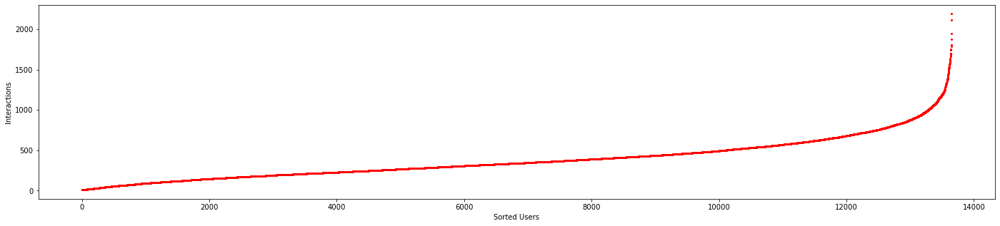

In [70]:
%matplotlib inline

plt.rcParams["figure.figsize"] = (24, 5)

plt.plot(sorted_interaction_per_user, 'ro', markersize=2)
plt.ylabel('Interactions')
plt.xlabel('Sorted Users')
plt.show()

In [71]:
features_per_item = np.ediff1d(ICM_genre.indptr)

items_sorted_by_features = np.argsort(-features_per_item)
sorted_features_per_item = np.sort(features_per_item)

Text(0, 0.5, 'Features')

Text(0.5, 0, 'Sorted Items')

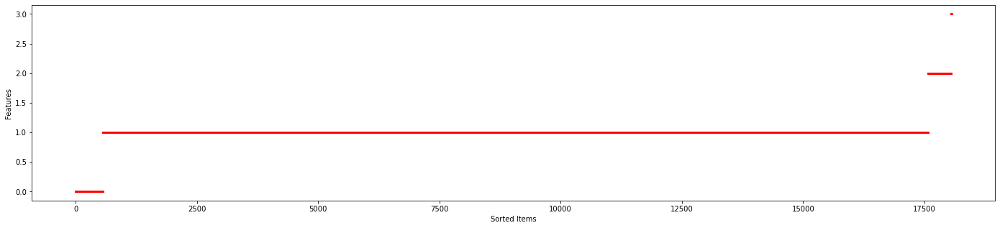

In [72]:
%matplotlib inline

plt.rcParams["figure.figsize"] = (24, 5)

plt.plot(sorted_features_per_item, 'ro', markersize=2)
plt.ylabel('Features')
plt.xlabel('Sorted Items')
plt.show()

In [289]:
features_per_item = np.ediff1d(ICM_subgenre.indptr)

items_sorted_by_features = np.argsort(-features_per_item)
sorted_features_per_item = np.sort(features_per_item)

Text(0, 0.5, 'Features')

Text(0.5, 0, 'Sorted Items')

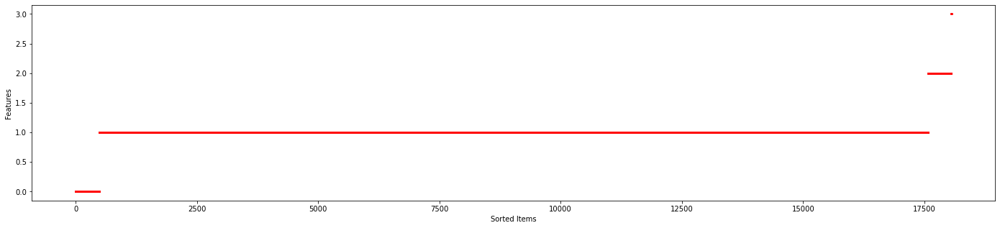

In [291]:
plt.rcParams["figure.figsize"] = (24, 5)

plt.plot(sorted_features_per_item, 'ro', markersize=2)
plt.ylabel('Features')
plt.xlabel('Sorted Items')
plt.show()

In [292]:
features_per_item = np.ediff1d(ICM_event.indptr)

items_sorted_by_features = np.argsort(-features_per_item)
sorted_features_per_item = np.sort(features_per_item)

Text(0, 0.5, 'Features')

Text(0.5, 0, 'Sorted Items')

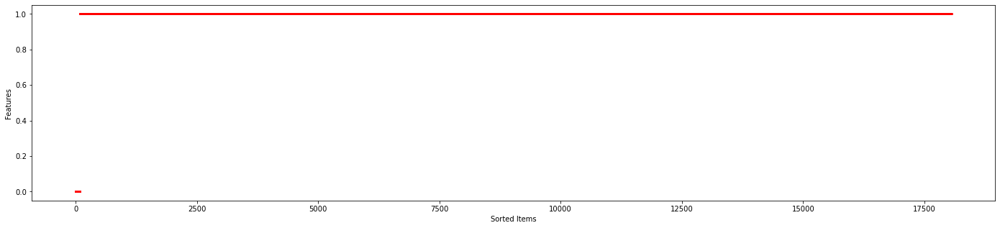

In [293]:
plt.rcParams["figure.figsize"] = (24, 5)

plt.plot(sorted_features_per_item, 'ro', markersize=2)
plt.ylabel('Features')
plt.xlabel('Sorted Items')
plt.show()

In [294]:
features_per_item = np.ediff1d(ICM_channel.indptr)

items_sorted_by_features = np.argsort(-features_per_item)
sorted_features_per_item = np.sort(features_per_item)

Text(0, 0.5, 'Features')

Text(0.5, 0, 'Sorted Items')

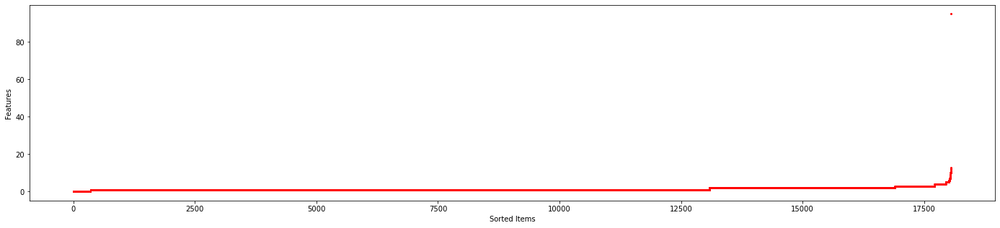

In [297]:
plt.rcParams["figure.figsize"] = (24, 5)

plt.plot(sorted_features_per_item, 'ro', markersize=2)
plt.ylabel('Features')
plt.xlabel('Sorted Items')
plt.show()

## Split data

In [ ]:
#URM_train_validation, URM_test = split_train_in_two_percentage_global_sample(URM_all, train_percentage = 0.80)
#URM_train, URM_validation = split_train_in_two_percentage_global_sample(URM_train_validation, train_percentage = 0.80)

In [ ]:
#scipy.sparse.save_npz('./Dataset/URM_train_validation.npz', URM_train_validation, compressed=True)
#scipy.sparse.save_npz('./Dataset/URM_test.npz', URM_test, compressed=True)
#scipy.sparse.save_npz('./Dataset/URM_train.npz', URM_train, compressed=True)
#scipy.sparse.save_npz('./Dataset/URM_validation.npz', URM_validation, compressed=True)

In [76]:
USE_AUGMENTED = False
SPLIT_URM_ONLY = True

if USE_AUGMENTED == False:
    
    #URM_train_validation = scipy.sparse.load_npz('./Dataset/URM_train_validation.npz')
    #URM_test = scipy.sparse.load_npz('./Dataset/URM_test.npz')
    #URM_train = scipy.sparse.load_npz('./Dataset/URM_train.npz')
    #URM_validation = scipy.sparse.load_npz('./Dataset/URM_validation.npz')

    URM_train, URM_validation = split_train_in_two_percentage_global_sample(URM_all, train_percentage = 0.80)

else:

    if SPLIT_URM_ONLY == True:
        URM_train_validation = scipy.sparse.load_npz('./Dataset/URM_train_validation.npz')
        URM_test = scipy.sparse.load_npz('./Dataset/URM_test.npz')
        URM_train = scipy.sparse.load_npz('./Dataset/URM_train.npz')
        URM_validation = scipy.sparse.load_npz('./Dataset/URM_validation.npz')

        URM_train_validation = sps.vstack([URM_train_validation.tocoo(), ICM_genre.T.tocoo(), ICM_subgenre.T.tocoo(), ICM_event.T.tocoo(), ICM_channel.T.tocoo()], format='csr')
        URM_train = sps.vstack([URM_train.tocoo(), ICM_genre.T.tocoo(), ICM_subgenre.T.tocoo(), ICM_event.T.tocoo(), ICM_channel.T.tocoo()], format='csr')
        
    
    else:

        URM_all = sps.vstack([URM_all.tocoo(), ICM_genre.T.tocoo(), ICM_subgenre.T.tocoo(), ICM_event.T.tocoo(), ICM_channel.T.tocoo()], format='csr')

        URM_train_validation, URM_test = split_train_in_two_percentage_global_sample(URM_all, train_percentage = 0.80)
        URM_train, URM_validation = split_train_in_two_percentage_global_sample(URM_train_validation, train_percentage = 0.80)
    
evaluator_validation = EvaluatorHoldout(URM_validation, cutoff_list=[10], exclude_seen=True)
#evaluator_test = EvaluatorHoldout(URM_test, cutoff_list=[10], exclude_seen=True)

EvaluatorHoldout: Ignoring 13645 ( 0.0%) Users that have less than 1 test interactions


In [ ]:
#!cat './Dataset/data_target_users_test.csv'

In [ ]:
test_UserID_path = os.path.join(data_file_path, "data_target_users_test.csv")

test_UserID_dataframe = pd.read_csv(filepath_or_buffer=test_UserID_path, 
                                    sep=",", 
                                    dtype={0:int},
                                    engine='python')

test_UserID_dataframe.columns = ["UserID"]

In [ ]:
print('Number of user to test: ', len(test_UserID_dataframe))
print('Number of user in URM: ', n_users)

Number of user to test:  13650
Number of user in URM:  13650


In [ ]:
test_UserID_dataframe.head()

,UserID
0,0
1,1
2,2
3,3
4,4


In [ ]:
test_UserID_array = test_UserID_dataframe.to_numpy().ravel().tolist()

## Splitted Data Analysis

### URM split

In [77]:
interaction_per_user = np.ediff1d(URM_all.indptr)

users_sorted_by_interactions = np.argsort(-interaction_per_user)
sorted_interaction_per_user = np.sort(interaction_per_user)

In [78]:
train_interaction_per_user = np.ediff1d(URM_train.indptr)
train_users_sorted_by_interactions = np.argsort(-train_interaction_per_user)
train_sorted_interaction_per_user = np.sort(train_interaction_per_user)

In [79]:
validation_interaction_per_user = np.ediff1d(URM_validation.indptr)
validation_users_sorted_by_interactions = np.argsort(-validation_interaction_per_user)
validation_sorted_interaction_per_user = np.sort(validation_interaction_per_user)

In [319]:
test_interaction_per_user = np.ediff1d(URM_test.indptr)
test_users_sorted_by_interactions = np.argsort(-test_interaction_per_user)
test_sorted_interaction_per_user = np.sort(test_interaction_per_user)

NameError: name 'test_sorted_interaction_per_user' is not defined

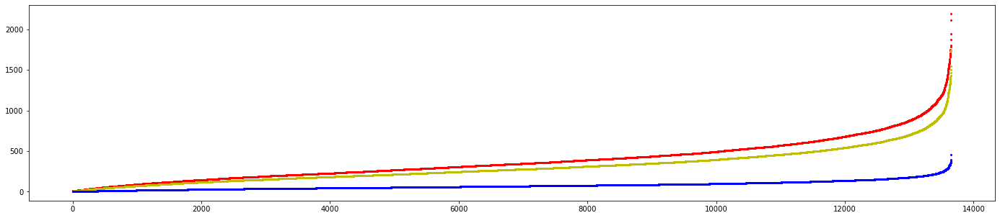

In [80]:
%matplotlib inline

plt.rcParams["figure.figsize"]=(24, 5)

plt.plot(sorted_interaction_per_user, 'ro', markersize=2, label='All')

plt.plot(train_sorted_interaction_per_user, 'yo', markersize=2, label='Train')
plt.plot(validation_sorted_interaction_per_user, 'bo', markersize=2, label='Validation')
plt.plot(test_sorted_interaction_per_user, 'go', markersize=2, label='Test')

plt.ylabel('Interactions')
plt.xlabel('Sorted Users')
plt.legend(loc='best')
plt.show()

## Recommenders

### Utility Functions

In [81]:
def _get_instance(recommender_class, URM_train, ICM_all, UCM_all):

    if issubclass(recommender_class, BaseItemCBFRecommender):
        recommender_object = recommender_class(URM_train, ICM_all)
    elif issubclass(recommender_class, BaseUserCBFRecommender):
        recommender_object = recommender_class(URM_train, UCM_all)
    else:
        recommender_object = recommender_class(URM_train)

    return recommender_object

In [83]:
def recommend(URM_train, items_scores, at=10, remove_seen=True):

    #n_items = URM_train.shape[0]

    start_time = time.time()

    recommended_items = []
    
    if remove_seen:

        for user_id in test_UserID_array:

            seen_items = URM_train.indices[URM_train.indptr[user_id]:URM_train.indptr[user_id+1]]
        
            unseen_items_mask = np.in1d(items_scores, seen_items, assume_unique=True, invert = True)

            unseen_items = items_scores[unseen_items_mask]

            recommended_items.append(unseen_items[0:at].tolist())

    else:
        recommended_items = items_scores[0:at].tolist()
        
    end_time = time.time()
    
    print("Computing recommendation for each user at a time runs at {:.2f} users/sec".format(len(test_UserID_array)/(end_time-start_time)))
    
    return recommended_items

In [84]:
def write_submission(recommended_items, filename = 'submission.csv'):
    
    directory_path = "./Submissions"
    file_path = os.path.join(directory_path, filename)
    
    if not os.path.exists(directory_path):
        os.makedirs(directory_path)
    
    with open(file_path, "w") as f:
        f.write(f"{'user_id'},{'item_list'}\n")
        for user_id, items in enumerate(recommended_items):
            f.write(f"{user_id},{' '.join([str(item) for item in items])}\n")

### Random Recommender

In [ ]:
print("Algorithm: {}".format(Random))

recommender_object = _get_instance(Random, URM_train_validation, None, None)

recommender_object.fit()

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

items_scores = recommender_object._compute_item_score(user_id_array = [0], items_to_compute = None)

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.NonPersonalizedRecommender.Random'>
EvaluatorHoldout: Processed 13646 (100.0%) in 17.59 sec. Users per second: 776
PRECISION: 0.0041844
MAP: 0.0012880


### TopPop Recommender

In [ ]:
evaluator_validation = EvaluatorHoldout(URM_validation, cutoff_list=[10], exclude_seen=True)
evaluator_test = EvaluatorHoldout(URM_test, cutoff_list=[10], exclude_seen=True)

EvaluatorHoldout: Ignoring 13634 ( 0.1%) Users that have less than 1 test interactions
EvaluatorHoldout: Ignoring 13646 ( 0.0%) Users that have less than 1 test interactions


In [324]:
print("Algorithm: {}".format(TopPop))

recommender_object = _get_instance(TopPop, URM_train_validation, None, None)

recommender_object.fit()

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

items_scores = recommender_object._compute_item_score(user_id_array = [0], items_to_compute = None) # popularity is equal for everybody hence user_id_array = [0]

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.NonPersonalizedRecommender.TopPop'>
TopPopRecommender: URM Detected 5385 (27.2%) users with no interactions.
EvaluatorHoldout: Processed 14162 (100.0%) in 12.37 sec. Users per second: 1144
PRECISION: 0.2717625
MAP: 0.1611461


With exclude_seen = False in evaluator_test

In [ ]:
print("Algorithm: {}".format(TopPop))

recommender_object = _get_instance(TopPop, URM_train_validation, None, None)

recommender_object.fit()

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

items_scores = recommender_object._compute_item_score(user_id_array = [0], items_to_compute = None) # popularity is equal for everybody hence user_id_array = [0]

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.NonPersonalizedRecommender.TopPop'>
EvaluatorHoldout: Processed 13646 (100.0%) in 14.32 sec. Users per second: 953
PRECISION: 0.1361644
MAP: 0.0569619


In [60]:
items_scores = items_scores.ravel().tolist()
items_scores[:10]

[9.0, 130.0, 41.0, 29.0, 3.0, 39.0, 122.0, 540.0, 3.0, 53.0]

In [ ]:
# Basically it is computing this
item_popularity = np.ediff1d(URM_train_validation.tocsc().indptr)
item_popularity

array([  9, 130,  41, ..., 370,  41,  78], dtype=int32)

In [ ]:
popular_items = np.argsort(items_scores)
popular_items = np.flip(popular_items, axis = 0)
popular_items[:10]

array([ 6177,  3473,  3899,  6214,  8635, 17330, 16365, 15119,  5273,
       16846])

In [ ]:
for item in popular_items[:10]: 
  if item in URM_train_validation.indices[URM_train_validation.indptr[0]:URM_train_validation.indptr[1]]:
    print(item)
  else:
    print(item, ' <---- NOT Seen')

6177  <---- NOT Seen
3473  <---- NOT Seen
3899  <---- NOT Seen
6214
8635  <---- NOT Seen
17330
16365  <---- NOT Seen
15119
5273  <---- NOT Seen
16846


In [ ]:
popular_items = np.argsort(items_scores)
popular_items = np.flip(popular_items, axis = 0)

popular_items = recommend(URM_train_validation, popular_items, at=10, remove_seen=True)
popular_items[0][:]

Computing recommendation for each user at a time runs at 496.91 users/sec


[6177, 3473, 3899, 8635, 16365, 5273, 2665, 13134, 15778, 1551]

In [61]:
popular_items = recommender_object.recommend(test_UserID_array,
                                             cutoff = 10, 
                                             remove_seen_flag = True, 
                                             items_to_compute = None,
                                             remove_top_pop_flag = False,
                                             remove_custom_items_flag = False,
                                             return_scores = False)
popular_items[0][:]

[6177, 3473, 3899, 8635, 16365, 5273, 2665, 13134, 15778, 1551]

In [63]:
len(popular_items)
len(test_UserID_array)

13650

13650

In [68]:
recommender_object = _get_instance(TopPop, URM_all, None, None)

recommender_object.fit()

popular_items = recommender_object.recommend(test_UserID_array,
                                             cutoff = 10, 
                                             remove_seen_flag = True, 
                                             items_to_compute = None,
                                             remove_top_pop_flag = False,
                                             remove_custom_items_flag = False,
                                             return_scores = False)

write_submission(popular_items, filename = 'TopPop_excludeSeen_submission.csv')

popular_items = recommender_object.recommend(test_UserID_array,
                                             cutoff = 10, 
                                             remove_seen_flag = False, 
                                             items_to_compute = None,
                                             remove_top_pop_flag = False,
                                             remove_custom_items_flag = False,
                                             return_scores = False)

write_submission(popular_items, filename = 'TopPop_submission.csv')

In [ ]:
start_time = time.time()

recommender_object = _get_instance(UserKNNCFRecommender, URM_all, None, None)

recommender_object.fit()

items_scores = recommender_object._compute_item_score(user_id_array = [0], items_to_compute = None) # popularity is equal for everybody hence user_id_array = [0]

items_scores = items_scores.ravel().tolist()

popular_items = np.argsort(items_scores)
popular_items = np.flip(popular_items, axis = 0)

popular_items = recommend(URM_all, popular_items, at=10, remove_seen=True)

write_submission(popular_items, filename = 'TopPop_submission.csv')

end_time = time.time()
print('Submission file created in: ', end_time - start_time, ' sec')

Computing recommendation for each user at a time runs at 661.27 users/sec
Submission file created in:  20.915098428726196  sec


### User KNN Collaborative Filtering

In [ ]:
print("Algorithm: {}".format(UserKNNCFRecommender))

recommender_object = _get_instance(UserKNNCFRecommender, URM_train_validation, None, None) #🎅

recommender_object.fit(normalize=True)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

recommender_object.fit(normalize=False)

results_run_2, results_run_string_2 = evaluator_test.evaluateRecommender(recommender_object)

print("\nUser-KNN with Normalization")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

print("\nUser-KNN without Normalization")

index = results_run_string_2.find("PRECISION:")
print(results_run_string_2[index:index+20])

index = results_run_string_2.find("MAP:")
print(results_run_string_2[index:index+14])

Algorithm: <class 'Recommenders.KNN.UserKNNCFRecommender.UserKNNCFRecommender'>
Similarity column 13650 (100.0%), 310.64 column/sec. Elapsed time 43.94 sec
EvaluatorHoldout: Processed 13646 (100.0%) in 17.22 sec. Users per second: 792
Similarity column 13650 (100.0%), 321.07 column/sec. Elapsed time 42.51 sec
EvaluatorHoldout: Processed 13646 (100.0%) in 15.22 sec. Users per second: 897

User-KNN with Normalization
PRECISION: 0.3278250
MAP: 0.1950317

User-KNN without Normalization
PRECISION: 0.2308002
MAP: 0.1320076


Without normalization the performance are much worse.

In [ ]:
recommender_object = _get_instance(UserKNNCFRecommender, URM_train_validation, None, None)

recommender_object.fit(normalize=True, feature_weighting = "BM25")

results_run_3, results_run_string_3 = evaluator_test.evaluateRecommender(recommender_object)

recommender_object.fit(normalize=True, feature_weighting = "TF-IDF")

results_run_4, results_run_string_4 = evaluator_test.evaluateRecommender(recommender_object)

print("\nUser-KNN with Normalization and BM25")

index = results_run_string_3.find("PRECISION:")
print(results_run_string_3[index:index+20])

index = results_run_string_3.find("MAP:")
print(results_run_string_3[index:index+14])

print("\nUser-KNN with Normalization and TF-IDF")

index = results_run_string_4.find("PRECISION:")
print(results_run_string_4[index:index+20])

index = results_run_string_4.find("MAP:")
print(results_run_string_4[index:index+14])

Similarity column 13650 (100.0%), 328.99 column/sec. Elapsed time 41.49 sec
EvaluatorHoldout: Processed 13646 (100.0%) in 16.82 sec. Users per second: 811
Similarity column 13650 (100.0%), 298.74 column/sec. Elapsed time 45.69 sec
EvaluatorHoldout: Processed 13646 (100.0%) in 16.49 sec. Users per second: 828

User-KNN with Normalization and BM25
PRECISION: 0.1708120
MAP: 0.0875229

User-KNN with Normalization and TF-IDF
PRECISION: 0.2615785
MAP: 0.1461417


The performance with feature weighting decrease a lot with BM25 and less with TF-IDF.

##### Hyperparameter Tuning

In [ ]:
hyperparameters_range_dictionary = {
    "topK": Integer(5, 2000),
    "shrink": Integer(0, 2000),
    "similarity": Categorical(["cosine"]), #, "pearson", "jaccard", "tanimoto", "adjusted", "euclidean"]),
    "normalize": Categorical([True]),
    #"URM_bias": Categorical([True, False]), # non è categorical
    "feature_weighting": Categorical(["none"]),
}

In [ ]:
from Recommenders.KNN.UserKNNCFRecommender import UserKNNCFRecommender
from HyperparameterTuning.SearchBayesianSkopt import SearchBayesianSkopt

recommender_class = UserKNNCFRecommender

hyperparameterSearch = SearchBayesianSkopt(recommender_class,
                                           evaluator_validation=evaluator_validation,
                                           evaluator_test=evaluator_test)

In [ ]:
from HyperparameterTuning.SearchAbstractClass import SearchInputRecommenderArgs
  
recommender_input_args = SearchInputRecommenderArgs(
    CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],     # For a CBF model simply put [URM_train, ICM_train]
    CONSTRUCTOR_KEYWORD_ARGS = {},
    FIT_POSITIONAL_ARGS = [],
    FIT_KEYWORD_ARGS = {}
)

In [ ]:
recommender_input_args_last_test = SearchInputRecommenderArgs(
    CONSTRUCTOR_POSITIONAL_ARGS = [URM_train_validation],     # For a CBF model simply put [URM_train_validation, ICM_train]
    CONSTRUCTOR_KEYWORD_ARGS = {},
    FIT_POSITIONAL_ARGS = [],
    FIT_KEYWORD_ARGS = {}
)

In [ ]:
output_folder_path = "result_experiments/ValidationExcludeSeen/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)
    
n_cases = 50  # 50 with 30% random is a good number
n_random_starts = 20 #int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [ ]:
hyperparameterSearch.search(recommender_input_args,
                            recommender_input_args_last_test = recommender_input_args_last_test,
                            hyperparameter_search_space = hyperparameters_range_dictionary,
                            n_cases = n_cases,
                            n_random_starts = n_random_starts,
                            save_model = "last",
                            output_folder_path = output_folder_path, # Where to save the results
                            output_file_name_root = recommender_class.RECOMMENDER_NAME, # How to call the files
                            metric_to_optimize = metric_to_optimize,
                            cutoff_to_optimize = cutoff_to_optimize,
                      )

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 1776, 'shrink': 545, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'none'}
UserKNNCFRecommender: URM Detected 1 ( 0.0%) items with no interactions.
Similarity column 13650 (100.0%), 497.12 column/sec. Elapsed time 27.46 sec
EvaluatorHoldout: Processed 13634 (100.0%) in 42.60 sec. Users per second: 320
SearchBayesianSkopt: New best config found. Config 0: {'topK': 1776, 'shrink': 545, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'none'} - results: PRECISION: 0.2180065, PRECISION_RECALL_MIN_DEN: 0.2188012, RECALL: 0.0448960, MAP: 0.1053982, MAP_MIN_DEN: 0.1057851, MRR: 0.4349229, NDCG: 0.2248417, F1: 0.0744582, HIT_RATE: 0.8654834, ARHR_ALL_HITS: 0.6740843, NOVELTY: 0.0055924, AVERAGE_POPULARITY: 0.5842450, DIVERSITY_MEAN_INTER_LIST: 0.8411584, DIVERSITY_HERFINDAHL: 0.9841097, COVERAGE_ITEM: 0.2696163, COVERAGE_ITEM_CORRECT: 0.0500581, COVERAGE_

In [ ]:
from functools import partial
import os, multiprocessing

from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

MY_runHyperparameterSearch_Collaborative(UserKNNCFRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_cosine'... Loaded 15 configurations.
Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0054
Function value obtained: -0.1094
Current minimum: -0.1095
Iteration No: 2 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 2998, 'shrink': 1896, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'none'}
UserKNNCFRecommender: URM Detected 1 ( 0.0%) items with no interactions.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_jaccard'... Loaded 15 configurations.
Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0166
Function value obtained: -0.1059
Current minimum: -0.1075
Iteration No: 2 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 1939, 'shrink': 1460, 'similarity': 'jaccard', '

Process ForkPoolWorker-19:
Process ForkPoolWorker-18:
Process ForkPoolWorker-20:
Process ForkPoolWorker-21:
Traceback (most recent call last):
Traceback (most recent call last):


In [ ]:
#pool = multiprocessing.Pool(processes=int(multiprocessing.cpu_count()), maxtasksperchild=1)
#pool.map(runParameterSearch_Collaborative_partial, [UserKNNCFRecommender])

In [ ]:
def MY_run_KNNRecommender_on_similarity_type(similarity_type, hyperparameterSearch,
                                          hyperparameter_search_space,
                                          recommender_input_args,
                                          n_cases,
                                          n_random_starts,
                                          resume_from_saved,
                                          save_model,
                                          evaluate_on_test,
                                          max_total_time,
                                          output_folder_path,
                                          output_file_name_root,
                                          metric_to_optimize,
                                          cutoff_to_optimize,
                                          allow_weighting = False,
                                          allow_bias_ICM = False,
                                          allow_bias_URM = False,
                                          recommender_input_args_last_test = None):

    original_hyperparameter_search_space = hyperparameter_search_space

    hyperparameters_range_dictionary = {
        "topK": Integer(5, 5000),
        "shrink": Integer(0, 5000),
        "similarity": Categorical([similarity_type]),
        "normalize": Categorical([True, False]),
    }

    is_set_similarity = similarity_type in ["tversky", "dice", "jaccard", "tanimoto"]

    if similarity_type == "asymmetric":
        hyperparameters_range_dictionary["asymmetric_alpha"] = Real(low = 0, high = 2, prior = 'uniform')
        hyperparameters_range_dictionary["normalize"] = Categorical([True])

    elif similarity_type == "tversky":
        hyperparameters_range_dictionary["tversky_alpha"] = Real(low = 0, high = 2, prior = 'uniform')
        hyperparameters_range_dictionary["tversky_beta"] = Real(low = 0, high = 2, prior = 'uniform')
        hyperparameters_range_dictionary["normalize"] = Categorical([True])

    elif similarity_type == "euclidean":
        hyperparameters_range_dictionary["normalize"] = Categorical([True, False])
        hyperparameters_range_dictionary["normalize_avg_row"] = Categorical([True, False])
        hyperparameters_range_dictionary["similarity_from_distance_mode"] = Categorical(["lin", "log", "exp"])


    if not is_set_similarity:

        if allow_weighting:
            hyperparameters_range_dictionary["feature_weighting"] = Categorical(["none", "BM25", "TF-IDF"])

        if allow_bias_ICM:
            hyperparameters_range_dictionary["ICM_bias"] = Real(low = 1e-2, high = 1e+3, prior = 'log-uniform')

        if allow_bias_URM:
            hyperparameters_range_dictionary["URM_bias"] = Real(low = 1e-2, high = 1e+3, prior = 'log-uniform')

    local_hyperparameter_search_space = {**hyperparameters_range_dictionary, **original_hyperparameter_search_space}

    hyperparameterSearch.search(recommender_input_args,
                           hyperparameter_search_space= local_hyperparameter_search_space,
                           n_cases = n_cases,
                           n_random_starts = n_random_starts,
                           resume_from_saved = resume_from_saved,
                           save_model = save_model,
                           evaluate_on_test = evaluate_on_test,
                           max_total_time = max_total_time,
                           output_folder_path = output_folder_path,
                           output_file_name_root = output_file_name_root + "_" + similarity_type,
                           metric_to_optimize = metric_to_optimize,
                           cutoff_to_optimize = cutoff_to_optimize,
                           recommender_input_args_last_test = recommender_input_args_last_test)



In [ ]:
from functools import partial
import os, multiprocessing

from HyperparameterTuning.SearchBayesianSkopt import SearchBayesianSkopt
from HyperparameterTuning.SearchSingleCase import SearchSingleCase
from HyperparameterTuning.SearchAbstractClass import SearchInputRecommenderArgs

MY_runHyperparameterSearch_Collaborative(UserKNNCFRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_cosine' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 4140, 'shrink': 1144, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'none'}
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_jaccard' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 407, 'shrink': 2054, 'similarity': 'jaccard', 'normalize': False}
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_asymmetric' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 3732, 'shrink': 3444, 'similarity': 'asymmetric', 'normalize': True, 'asymmetric_alpha': 0.2283377715772315, 'feature_weighting': 'BM25'}
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_dice' Failed, no such file exists.

Iteration No: 1

Process ForkPoolWorker-6:
Process ForkPoolWorker-7:
Process ForkPoolWorker-5:
Traceback (most recent call last):
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/queues.py", line 355, in get
    with self._rlock:
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
Traceback (most recent call last):
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/process.py", line 315, in _bootstr

KeyboardInterrupt: ignored

  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/connection.py", line 414, in _recv_bytes
    buf = self._recv(4)
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/pool.py", line 48, in mapstar
    return list(map(*args))
  File "<ipython-input-306-c04df5e7d5cc>", line 58, in MY_run_KNNRecommender_on_similarity_type
    hyperparameterSearch.search(recommender_input_args,
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/multiprocessing/connection.py", line 379, in _recv
    chunk = read(handle, remaining)
  File "/home/alessio/Scrivania/RecSysChallengeCode/HyperparameterTuning/SearchBayesianSkopt.py", line 338, in search
    self.result = gp_minimize(self._objective_function_list_input,
KeyboardInterrupt
  File "/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/gp.py", line 259, in gp_minimize
    return base_minimize(
  File "/home/alessio/anaconda3/envs/RecSysFra

In [ ]:
MY_runHyperparameterSearch_Collaborative(UserKNNCFRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_cosine'... Loaded 50 configurations.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_cosine'... Result on last already available.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_jaccard'... Loaded 50 configurations.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_jaccard'... Result on last already available.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_asymmetric'... Loaded 49 configurations.
Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_dice'... Loaded 50 configurations.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_dice'... Result on last already available.
SearchBayesianSkopt: Resuming 'UserKNNCFRecommender_tversky'... Loaded 3 configurations.
Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0204
Function value obtained: -0.1096
Current minimum: -0.1096
Itera

In [ ]:
from Recommenders.DataIO import DataIO

data_loader = DataIO(folder_path = output_folder_path)
search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_metadata.zip")

search_metadata.keys()

In [ ]:
hyperparameters_df = search_metadata["hyperparameters_df"]
hyperparameters_df

In [ ]:
result_on_validation_df = search_metadata["result_on_validation_df"]
result_on_validation_df

In [ ]:
result_best_on_test = search_metadata["result_on_last"]
result_best_on_test

In [ ]:
best_hyperparameters = search_metadata["hyperparameters_best"]
best_hyperparameters

In [ ]:
time_df = search_metadata["time_df"]
time_df

In [ ]:
exception_list = search_metadata["exception_list"]
exception_list

### Item-KNN

In [334]:
print("Algorithm: {}".format(ItemKNNCFRecommender))

recommender_object = _get_instance(ItemKNNCFRecommender, URM_train, None, None)

recommender_object.fit(normalize=True)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

recommender_object.fit(normalize=False)

results_run_2, results_run_string_2 = evaluator_test.evaluateRecommender(recommender_object)

print("\nItem-KNN with Normalization")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

print("\nItem-KNN without Normalization")

index = results_run_string_2.find("PRECISION:")
print(results_run_string_2[index:index+20])

index = results_run_string_2.find("MAP:")
print(results_run_string_2[index:index+14])

Algorithm: <class 'Recommenders.KNN.ItemKNNCFRecommender.ItemKNNCFRecommender'>
ItemKNNCFRecommender: URM Detected 37934 (67.2%) users with no interactions.
Similarity column 18059 (100.0%), 1124.59 column/sec. Elapsed time 16.06 sec
EvaluatorHoldout: Processed 17141 (100.0%) in 17.84 sec. Users per second: 961
Similarity column 18059 (100.0%), 1224.23 column/sec. Elapsed time 14.75 sec
EvaluatorHoldout: Processed 17141 (100.0%) in 26.33 sec. Users per second: 651

Item-KNN with Normalization
PRECISION: 0.2517006
MAP: 0.1366095

Item-KNN without Normalization
PRECISION: 0.2272563
MAP: 0.1235763


In [351]:
output_folder_path = "result_experiments/Agmented_all_URMonly_split/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

n_cases = 50  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [ ]:
from functools import partial
import os, multiprocessing

from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

runHyperparameterSearch_Collaborative(ItemKNNCFRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test = URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      allow_weighting = True, 
                                      allow_bias_URM = True,
                                      parallelizeKNN = True)

### With Validation

In [ ]:
earlystopping_keywargs = {"validation_every_n": 1,
                          "stop_on_validation": True,
                          "evaluator_object": EvaluatorHoldout(URM_validation, [10], exclude_seen=True),
                          "lower_validations_allowed": 10,
                          "validation_metric": "MAP",
                              }

fit_params = {"epochs": 100, **earlystopping_keywargs}

EvaluatorHoldout: Ignoring 13634 ( 0.1%) Users that have less than 1 test interactions


#### IALS 

In [ ]:
print("Algorithm: {}".format(IALSRecommender))

recommender_object = _get_instance(IALSRecommender, URM_train, None, None)

recommender_object.fit(confidence_scaling = "linear", **fit_params)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

recommender_object.fit(confidence_scaling = "log", **fit_params)

results_run_2, results_run_string_2 = evaluator_test.evaluateRecommender(recommender_object)

print("\nIALS with linear confidence scaling")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

print("\nIALS with log confidence scaling")

index = results_run_string_2.find("PRECISION:")
print(results_run_string_2[index:index+20])

index = results_run_string_2.find("MAP:")
print(results_run_string_2[index:index+14])

Algorithm: <class 'Recommenders.MatrixFactorization.IALSRecommender.IALSRecommender'>
IALSRecommender: URM Detected 1 ( 0.0%) items with no interactions.
IALSRecommender: Validation begins...
EvaluatorHoldout: Processed 13634 (100.0%) in 14.24 sec. Users per second: 958
IALSRecommender: CUTOFF: 20 - PRECISION: 0.1438903, PRECISION_RECALL_MIN_DEN: 0.1471628, RECALL: 0.0539579, MAP: 0.0518102, MAP_MIN_DEN: 0.0527640, MRR: 0.3642772, NDCG: 0.1548415, F1: 0.0784846, HIT_RATE: 0.8753851, ARHR_ALL_HITS: 0.5921629, NOVELTY: 0.0107401, AVERAGE_POPULARITY: 0.5913730, DIVERSITY_MEAN_INTER_LIST: 0.8221719, DIVERSITY_HERFINDAHL: 0.9911056, COVERAGE_ITEM: 0.0368791, COVERAGE_ITEM_CORRECT: 0.0187164, COVERAGE_USER: 0.9988278, COVERAGE_USER_CORRECT: 0.8743590, DIVERSITY_GINI: 0.0064277, SHANNON_ENTROPY: 7.2846765, RATIO_DIVERSITY_HERFINDAHL: 0.9914880, RATIO_DIVERSITY_GINI: 0.0259315, RATIO_SHANNON_ENTROPY: 0.5879443, RATIO_AVERAGE_POPULARITY: 2.9103073, RATIO_NOVELTY: 0.0631654, 

IALSRecommender: N

**Hyperparameters must be tuned.**

#### MF Funk-SVD

In [ ]:
print("Algorithm: {}".format(MatrixFactorization_FunkSVD_Cython))

recommender_object = _get_instance(MatrixFactorization_FunkSVD_Cython, URM_train, None, None)

recommender_object.fit(**fit_params)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nFunk-SVD")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])


Algorithm: <class 'Recommenders.MatrixFactorization.Cython.MatrixFactorization_Cython.MatrixFactorization_FunkSVD_Cython'>
MatrixFactorization_FunkSVD_Cython_Recommender: URM Detected 1 ( 0.0%) items with no interactions.
FUNK_SVD: Processed 3383000 (100.0%) in 4.77 sec. MSE loss 1.49E-01. Sample per second: 708487
FUNK_SVD: Epoch 1 of 50. Elapsed time 4.54 sec
FUNK_SVD: Processed 3383000 (100.0%) in 4.95 sec. MSE loss 1.15E-03. Sample per second: 682744
FUNK_SVD: Epoch 2 of 50. Elapsed time 8.72 sec
FUNK_SVD: Processed 3383000 (100.0%) in 5.00 sec. MSE loss 9.83E-04. Sample per second: 676056
FUNK_SVD: Epoch 3 of 50. Elapsed time 12.76 sec
FUNK_SVD: Processed 3383000 (100.0%) in 4.36 sec. MSE loss 9.82E-04. Sample per second: 775329
FUNK_SVD: Epoch 4 of 50. Elapsed time 17.12 sec
FUNK_SVD: Processed 3383000 (100.0%) in 4.94 sec. MSE loss 9.82E-04. Sample per second: 685279
FUNK_SVD: Validation begins...
EvaluatorHoldout: Processed 13634 (100.0%) in 13.06 sec. Users per second: 1044
FU

#### Asymmetric-SVD

In [ ]:
print("Algorithm: {}".format(MatrixFactorization_AsySVD_Cython))

recommender_object = _get_instance(MatrixFactorization_AsySVD_Cython, URM_train, None, None)

recommender_object.fit(**fit_params)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nAsymmetric-SVD")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.MatrixFactorization.Cython.MatrixFactorization_Cython.MatrixFactorization_AsySVD_Cython'>
MatrixFactorization_AsySVD_Cython_Recommender: URM Detected 1 ( 0.0%) items with no interactions.
ASY_SVD: Estimating user factors... 
ASY_SVD: Estimating user factors... done!
ASY_SVD: Processed 3095491 (91.5%) in 5.00 min. MSE loss 8.89E-04. Sample per second: 10318
ASY_SVD: Processed 3382826 (100.0%) in 5.47 min. MSE loss 8.65E-04. Sample per second: 10299
ASY_SVD: Validation begins...
ASY_SVD: Estimating user factors... 
ASY_SVD: Estimating user factors... done!
EvaluatorHoldout: Processed 13634 (100.0%) in 13.83 sec. Users per second: 986
ASY_SVD: CUTOFF: 20 - PRECISION: 0.0035756, PRECISION_RECALL_MIN_DEN: 0.0036352, RECALL: 0.0011779, MAP: 0.0006623, MAP_MIN_DEN: 0.0006774, MRR: 0.0125719, NDCG: 0.0036182, F1: 0.0017720, HIT_RATE: 0.0676984, ARHR_ALL_HITS: 0.0129022, NOVELTY: 0.0178130, AVERAGE_POPULARITY: 0.0231267, DIVERSITY_MEAN_INTER_LIST: 0.9884680, DIVE

#### Matrix Factorization BPR

In [ ]:
print("Algorithm: {}".format(MatrixFactorization_BPR_Cython))

recommender_object = _get_instance(MatrixFactorization_BPR_Cython, URM_train, None, None)

recommender_object.fit(random_seed=SEED, **fit_params)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nMatrixFactorization BPR")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.MatrixFactorization.Cython.MatrixFactorization_Cython.MatrixFactorization_BPR_Cython'>
MatrixFactorization_BPR_Cython_Recommender: URM Detected 1 ( 0.0%) items with no interactions.
MF_BPR: Processed 14000 (100.0%) in 0.81 sec. MSE loss 2.00E-03. Sample per second: 17180
MF_BPR: Validation begins...
EvaluatorHoldout: Processed 13640 (100.0%) in 13.40 sec. Users per second: 1018
MF_BPR: CUTOFF: 10 - PRECISION: 0.0034531, PRECISION_RECALL_MIN_DEN: 0.0034604, RECALL: 0.0005354, MAP: 0.0011015, MAP_MIN_DEN: 0.0011052, MRR: 0.0106109, NDCG: 0.0035789, F1: 0.0009270, HIT_RATE: 0.0335044, ARHR_ALL_HITS: 0.0108129, NOVELTY: 0.0088939, AVERAGE_POPULARITY: 0.0239195, DIVERSITY_MEAN_INTER_LIST: 0.9909366, DIVERSITY_HERFINDAHL: 0.9990864, COVERAGE_ITEM: 0.2402126, COVERAGE_ITEM_CORRECT: 0.0150064, COVERAGE_USER: 0.9992674, COVERAGE_USER_CORRECT: 0.0334799, DIVERSITY_GINI: 0.0748617, SHANNON_ENTROPY: 10.7920175, RATIO_DIVERSITY_HERFINDAHL: 0.9994722, RATIO_DIVERSITY_

In [ ]:
from Recommenders.MatrixFactorization.Cython.MatrixFactorization_Cython import MatrixFactorization_BPR_Cython, MatrixFactorization_FunkSVD_Cython, MatrixFactorization_AsySVD_Cython

from Recommenders.MatrixFactorization.PureSVDRecommender import PureSVDRecommender, PureSVDItemRecommender

MY_runHyperparameterSearch_Collaborative(MatrixFactorization_BPR_Cython,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True,
                                      allow_dropout_MF = True) ### Added

#### SLIM BPR

In [ ]:
print("Algorithm: {}".format(SLIM_BPR_Cython))

recommender_object = _get_instance(SLIM_BPR_Cython, URM_train, None, None)

recommender_object.fit(random_seed=SEED, **fit_params)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nSLIM BPR")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.SLIM.Cython.SLIM_BPR_Cython.SLIM_BPR_Cython'>
SLIM_BPR_Recommender: URM Detected 1 ( 0.0%) items with no interactions.
SLIM_BPR_Recommender: Automatic selection of fastest train mode. Available RAM is 10145.00 MB (63.66%) of 15935.00 MB, required is 1304.51 MB. Using dense matrix.
Processed 13650 (100.0%) in 0.76 sec. BPR loss is 1.63E-04. Sample per second: 18078
SLIM_BPR_Recommender: Validation begins...
EvaluatorHoldout: Processed 13640 (100.0%) in 16.66 sec. Users per second: 819
SLIM_BPR_Recommender: CUTOFF: 10 - PRECISION: 0.1937537, PRECISION_RECALL_MIN_DEN: 0.1948974, RECALL: 0.0404831, MAP: 0.0912769, MAP_MIN_DEN: 0.0917187, MRR: 0.4116333, NDCG: 0.2020380, F1: 0.0669728, HIT_RATE: 0.8467009, ARHR_ALL_HITS: 0.6102458, NOVELTY: 0.0051868, AVERAGE_POPULARITY: 0.7406192, DIVERSITY_MEAN_INTER_LIST: 0.6632901, DIVERSITY_HERFINDAHL: 0.9663241, COVERAGE_ITEM: 0.0276317, COVERAGE_ITEM_CORRECT: 0.0067556, COVERAGE_USER: 0.9992674, COVERAGE_USER_CORRECT: 

In [ ]:
URM_train_validation, URM_test = split_train_in_two_percentage_global_sample(URM_all, train_percentage = 0.8)
URM_train, URM_validation = split_train_in_two_percentage_global_sample(URM_train_validation, train_percentage = 0.8)

evaluator_validation = EvaluatorHoldout(URM_validation, cutoff_list=[10])
evaluator_test = EvaluatorHoldout(URM_test, cutoff_list=[10])

EvaluatorHoldout: Ignoring 13634 ( 0.1%) Users that have less than 1 test interactions
EvaluatorHoldout: Ignoring 13645 ( 0.0%) Users that have less than 1 test interactions


In [ ]:
hyperparameters_range_dictionary = {
                "topK": Integer(5, 1000),
                "epochs": Categorical([1500]),
                "symmetric": Categorical([True, False]),
                "sgd_mode": Categorical(["sgd", "adagrad", "adam"]),
                "lambda_i": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "lambda_j": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "learning_rate": Real(low = 1e-4, high = 1e-1, prior = 'log-uniform'),
            }

In [ ]:
from Recommenders.SLIM.Cython.SLIM_BPR_Cython import SLIM_BPR_Cython
from HyperparameterTuning.SearchBayesianSkopt import SearchBayesianSkopt

recommender_class = SLIM_BPR_Cython

hyperparameterSearch = SearchBayesianSkopt(recommender_class,
                                           evaluator_validation=evaluator_validation,
                                           evaluator_test=evaluator_test)

In [ ]:
from HyperparameterTuning.SearchAbstractClass import SearchInputRecommenderArgs
  
recommender_input_args = SearchInputRecommenderArgs(
    CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],     # For a CBF model simply put [URM_train, ICM_train]
    CONSTRUCTOR_KEYWORD_ARGS = {},
    FIT_POSITIONAL_ARGS = [],
    FIT_KEYWORD_ARGS = {}
)

In [ ]:
recommender_input_args_last_test = SearchInputRecommenderArgs(
    CONSTRUCTOR_POSITIONAL_ARGS = [URM_train_validation],     # For a CBF model simply put [URM_train_validation, ICM_train]
    CONSTRUCTOR_KEYWORD_ARGS = {},
    FIT_POSITIONAL_ARGS = [],
    FIT_KEYWORD_ARGS = {}
)

In [ ]:
output_folder_path = "result_experiments/Try/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)
    
n_cases = 10  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [ ]:
from functools import partial
import os, multiprocessing

from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

runHyperparameterSearch_Collaborative(SLIM_BPR_Cython,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

Output streaming troncato alle ultime 5000 righe.
Processed 13650 (100.0%) in 0.37 sec. BPR loss is 6.97E+03. Sample per second: 37000
SLIM_BPR_Recommender: Epoch 522 of 1500. Elapsed time 4.30 min
Processed 13650 (100.0%) in 0.72 sec. BPR loss is 7.01E+03. Sample per second: 18839
SLIM_BPR_Recommender: Epoch 523 of 1500. Elapsed time 4.31 min
Processed 13650 (100.0%) in 1.07 sec. BPR loss is 6.89E+03. Sample per second: 12790
SLIM_BPR_Recommender: Epoch 524 of 1500. Elapsed time 4.31 min
Processed 13650 (100.0%) in 0.44 sec. BPR loss is 6.84E+03. Sample per second: 30902
SLIM_BPR_Recommender: Epoch 525 of 1500. Elapsed time 4.32 min
Processed 13650 (100.0%) in 0.81 sec. BPR loss is 6.86E+03. Sample per second: 16756
SLIM_BPR_Recommender: Epoch 526 of 1500. Elapsed time 4.33 min
Processed 13650 (100.0%) in 1.19 sec. BPR loss is 6.78E+03. Sample per second: 11508
SLIM_BPR_Recommender: Epoch 527 of 1500. Elapsed time 4.33 min
Processed 13650 (100.0%) in 0.60 sec. BPR loss is 6.82E+03. Sa

#### Pure-SVD

In [ ]:
print("Algorithm: {}".format(PureSVDRecommender))

recommender_object = _get_instance(PureSVDRecommender, URM_train, None, None)

recommender_object.fit(random_seed=SEED)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nPure-SVD")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.MatrixFactorization.PureSVDRecommender.PureSVDRecommender'>
PureSVDRecommender: URM Detected 1 ( 0.0%) items with no interactions.
PureSVDRecommender: Computing SVD decomposition...
PureSVDRecommender: Computing SVD decomposition... done in 5.91 sec
EvaluatorHoldout: Processed 13645 (100.0%) in 14.07 sec. Users per second: 969

Pure-SVD
PRECISION: 0.2429681
MAP: 0.1234313


#### LightFM CF

In [ ]:
print("Algorithm: {}".format(LightFMCFRecommender))

recommender_object = _get_instance(LightFMCFRecommender, URM_train, None, None)

recommender_object.fit(**fit_params)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nLightFM CF")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.FactorizationMachines.LightFMRecommender.LightFMCFRecommender'>
LightFMCFRecommender: URM Detected 1 ( 0.0%) items with no interactions.
LightFMCFRecommender: Validation begins...
EvaluatorHoldout: Processed 13640 (100.0%) in 31.72 sec. Users per second: 430
LightFMCFRecommender: CUTOFF: 10 - PRECISION: 0.1916862, PRECISION_RECALL_MIN_DEN: 0.1931871, RECALL: 0.0402996, MAP: 0.0931694, MAP_MIN_DEN: 0.0938405, MRR: 0.4241462, NDCG: 0.2041296, F1: 0.0665978, HIT_RATE: 0.8412023, ARHR_ALL_HITS: 0.6263890, NOVELTY: 0.0051527, AVERAGE_POPULARITY: 0.7708389, DIVERSITY_MEAN_INTER_LIST: 0.5724474, DIVERSITY_HERFINDAHL: 0.9572405, COVERAGE_ITEM: 0.0047622, COVERAGE_ITEM_CORRECT: 0.0039316, COVERAGE_USER: 0.9992674, COVERAGE_USER_CORRECT: 0.8405861, DIVERSITY_GINI: 0.0012513, SHANNON_ENTROPY: 4.7946070, RATIO_DIVERSITY_HERFINDAHL: 0.9576102, RATIO_DIVERSITY_GINI: 0.0050500, RATIO_SHANNON_ENTROPY: 0.3869974, RATIO_AVERAGE_POPULARITY: 3.7229194, RATIO_NOVELTY: 0.0303

### MultiVAE

In [ ]:
try:
    import tensorflow as tf
except ImportError:
    print("Tensorflow is not available")

from Recommenders.Neural.architecture_utils import generate_autoencoder_architecture

Tensorflow is not available


In [ ]:
print("Algorithm: {}".format(MultVAERecommender))

recommender_object = _get_instance(MultVAERecommender, URM_train, None, None)

recommender_object.fit(**fit_params)

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nLightFM CF")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

### RP3beta

In [343]:
output_folder_path = "result_experiments/Agmented_all_URMonly_split/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

In [344]:
n_cases = 50  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [335]:
fit_params = {'topK': 1000, 'alpha': 0.8847553831873401, 'beta': 0.4726489033300335, 'normalize_similarity': True}

In [336]:
print("Algorithm: {}".format(RP3betaRecommender))

recommender_object = _get_instance(RP3betaRecommender, URM_train_validation, None, None)

recommender_object.fit()

results_run_1, results_run_string_1 = evaluator_test.evaluateRecommender(recommender_object)

print("\nP3alpha")

index = results_run_string_1.find("PRECISION:")
print(results_run_string_1[index:index+20])

index = results_run_string_1.find("MAP:")
print(results_run_string_1[index:index+14])

Algorithm: <class 'Recommenders.GraphBased.RP3betaRecommender.RP3betaRecommender'>
RP3betaRecommender: URM Detected 37670 (66.7%) users with no interactions.
EvaluatorHoldout: Processed 17141 (100.0%) in 16.11 sec. Users per second: 1064

P3alpha
PRECISION: 0.3766058
MAP: 0.2619412


In [340]:
# WITH ICM AUGMENTATION

from functools import partial
import os, multiprocessing

from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

runHyperparameterSearch_Collaborative(RP3betaRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'RP3betaRecommender' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 1772, 'alpha': 0.03893627392619304, 'beta': 0.5886438227002312, 'normalize_similarity': True}
RP3betaRecommender: URM Detected 37934 (67.2%) users with no interactions.
EvaluatorHoldout: Processed 16923 (100.0%) in 38.49 sec. Users per second: 440
SearchBayesianSkopt: New best config found. Config 0: {'topK': 1772, 'alpha': 0.03893627392619304, 'beta': 0.5886438227002312, 'normalize_similarity': True} - results: PRECISION: 0.2134019, PRECISION_RECALL_MIN_DEN: 0.2244530, RECALL: 0.0673777, MAP: 0.1074306, MAP_MIN_DEN: 0.1136070, MRR: 0.4201107, NDCG: 0.2272989, F1: 0.1024186, HIT_RATE: 0.8161673, ARHR_ALL_HITS: 0.6647400, NOVELTY: 0.0060525, AVERAGE_POPULARITY: 0.4917816, DIVERSITY_MEAN_INTER_LIST: 0.8866186, DIVERSITY_HERFINDAHL: 0.9886566, COVERAGE_ITEM: 0.4262695, COVERAGE_ITEM_CORRECT: 0.2510660, 

In [345]:
# WITH ICM AUGMENTATION but only URM split 

from functools import partial
import os, multiprocessing

from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

runHyperparameterSearch_Collaborative(RP3betaRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'RP3betaRecommender' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 1933, 'alpha': 0.8644884820300457, 'beta': 0.6095885543672039, 'normalize_similarity': False}
RP3betaRecommender: URM Detected 5344 (27.0%) users with no interactions.
EvaluatorHoldout: Processed 13634 (100.0%) in 34.49 sec. Users per second: 395
SearchBayesianSkopt: New best config found. Config 0: {'topK': 1933, 'alpha': 0.8644884820300457, 'beta': 0.6095885543672039, 'normalize_similarity': False} - results: PRECISION: 0.2179478, PRECISION_RECALL_MIN_DEN: 0.2187842, RECALL: 0.0465080, MAP: 0.1045304, MAP_MIN_DEN: 0.1048100, MRR: 0.4335946, NDCG: 0.2240882, F1: 0.0766580, HIT_RATE: 0.8779522, ARHR_ALL_HITS: 0.6701249, NOVELTY: 0.0056707, AVERAGE_POPULARITY: 0.5905056, DIVERSITY_MEAN_INTER_LIST: 0.8355116, DIVERSITY_HERFINDAHL: 0.9835450, COVERAGE_ITEM: 0.1838972, COVERAGE_ITEM_CORRECT: 0.0435240, C

In [ ]:
from functools import partial
import os, multiprocessing

from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

runHyperparameterSearch_Collaborative(RP3betaRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'RP3betaRecommender' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 23, 'alpha': 0.2543824162144324, 'beta': 1.1508215722642432, 'normalize_similarity': True}
RP3betaRecommender: URM Detected 1 ( 0.0%) items with no interactions.
EvaluatorHoldout: Processed 13640 (100.0%) in 7.93 sec. Users per second: 1721
SearchBayesianSkopt: New best config found. Config 0: {'topK': 23, 'alpha': 0.2543824162144324, 'beta': 1.1508215722642432, 'normalize_similarity': True} - results: PRECISION: 0.0025440, PRECISION_RECALL_MIN_DEN: 0.0025490, RECALL: 0.0004359, MAP: 0.0009060, MAP_MIN_DEN: 0.0009095, MRR: 0.0083208, NDCG: 0.0027666, F1: 0.0007442, HIT_RATE: 0.0233871, ARHR_ALL_HITS: 0.0086639, NOVELTY: 0.0109291, AVERAGE_POPULARITY: 0.0007347, DIVERSITY_MEAN_INTER_LIST: 0.9608260, DIVERSITY_HERFINDAHL: 0.9960756, COVERAGE_ITEM: 0.1882164, COVERAGE_ITEM_CORRECT: 0.0146187, COVERAGE_U

In [ ]:
n_cases = 50  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [ ]:
runHyperparameterSearch_Collaborative(RP3betaRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Extending previous number of cases from 10 to 50.

SearchBayesianSkopt: Resuming 'RP3betaRecommender'... Loaded 10 configurations.
Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 0.0007
Function value obtained: -0.0956
Current minimum: -0.1007
Iteration No: 2 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 972, 'alpha': 0.11857639373033349, 'beta': 1.2660808075006333, 'normalize_similarity': False}
RP3betaRecommender: URM Detected 1 ( 0.0%) items with no interactions.
EvaluatorHoldout: Processed 13640 (100.0%) in 23.61 sec. Users per second: 578
SearchBayesianSkopt: Config 10 is suboptimal. Config: {'topK': 972, 'alpha': 0.11857639373033349, 'beta': 1.2660808075006333, 'normalize_similarity': False} - results: PRECISION: 0.0005645, PRECISION_RECALL_MIN_DEN: 0.0005848, RECALL: 0.0001280, MAP: 0.0002070, MAP_MIN_DEN: 0.0002143, MRR: 0.0018769,

In [ ]:
output_folder_path = "result_experiments/Try2/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)
    
n_cases = 100  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [ ]:
from functools import partial
import os, multiprocessing

from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

runHyperparameterSearch_Collaborative(RP3betaRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'RP3betaRecommender' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 1827, 'alpha': 0.6739610334444001, 'beta': 0.7615162860366562, 'normalize_similarity': False}
RP3betaRecommender: URM Detected 1 ( 0.0%) items with no interactions.
EvaluatorHoldout: Processed 13634 (100.0%) in 34.63 sec. Users per second: 394
SearchBayesianSkopt: New best config found. Config 0: {'topK': 1827, 'alpha': 0.6739610334444001, 'beta': 0.7615162860366562, 'normalize_similarity': False} - results: PRECISION: 0.2209036, PRECISION_RECALL_MIN_DEN: 0.2222150, RECALL: 0.0486044, MAP: 0.1058141, MAP_MIN_DEN: 0.1062634, MRR: 0.4373553, NDCG: 0.2273826, F1: 0.0796777, HIT_RATE: 0.8868271, ARHR_ALL_HITS: 0.6789839, NOVELTY: 0.0057218, AVERAGE_POPULARITY: 0.5473691, DIVERSITY_MEAN_INTER_LIST: 0.8868495, DIVERSITY_HERFINDAHL: 0.9886784, COVERAGE_ITEM: 0.2061576, COVERAGE_ITEM_CORRECT: 0.0580874, COVE

In [ ]:
def MY_runHyperparameterSearch_Collaborative(recommender_class, URM_train, URM_train_last_test = None,
                                          n_cases = None, n_random_starts = None, resume_from_saved = False,
                                          save_model = "best", evaluate_on_test = "best", max_total_time = None,
                                          evaluator_validation = None, evaluator_test = None, evaluator_validation_earlystopping = None,
                                          metric_to_optimize = None, cutoff_to_optimize = None,
                                          output_folder_path ="result_experiments/", parallelizeKNN = True,
                                          allow_weighting = True, allow_bias_URM=False, allow_dropout_MF = False, similarity_type_list = None):
    """
    This function performs the hyperparameter optimization for a collaborative recommender
    :param recommender_class:   Class of the recommender object to optimize, it must be a BaseRecommender type
    :param URM_train:           Sparse matrix containing the URM training data
    :param URM_train_last_test: Sparse matrix containing the union of URM training and validation data to be used in the last evaluation
    :param n_cases:             Number of hyperparameter sets to explore
    :param n_random_starts:     Number of the initial random hyperparameter values to explore, usually set at 30% of n_cases
    :param resume_from_saved:   Boolean value, if True the optimization is resumed from the saved files, if False a new one is done
    :param save_model:          ["no", "best", "last"] which of the models to save, see HyperparameterTuning/SearchAbstractClass for details
    :param evaluate_on_test:    ["all", "best", "last", "no"] when to evaluate the model on the test data, see HyperparameterTuning/SearchAbstractClass for details
    :param max_total_time:    [None or int] if set stops the hyperparameter optimization when the time in seconds for training and validation exceeds the threshold
    :param evaluator_validation:    Evaluator object to be used for the validation of each hyperparameter set
    :param evaluator_validation_earlystopping:   Evaluator object to be used for the earlystopping of ML algorithms, can be the same of evaluator_validation
    :param evaluator_test:          Evaluator object to be used for the test results, the output will only be saved but not used
    :param metric_to_optimize:  String with the name of the metric to be optimized as contained in the output of the evaluator objects
    :param cutoff_to_optimize:  Integer with the recommendation list length to be optimized as contained in the output of the evaluator objects
    :param output_folder_path:  Folder in which to save the output files
    :param parallelizeKNN:      Boolean value, if True the various heuristics of the KNNs will be computed in parallel, if False sequentially
    :param allow_weighting:     Boolean value, if True it enables the use of TF-IDF and BM25 to weight features, users and items in KNNs
    :param allow_bias_URM:      Boolean value, if True it enables the use of bias to shift the values of the URM
    :param allow_dropout_MF:    Boolean value, if True it enables the use of dropout on the latent factors of MF algorithms
    :param similarity_type_list: List of strings with the similarity heuristics to be used for the KNNs
    """



    # If directory does not exist, create
    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)

    earlystopping_keywargs = {"validation_every_n": 100,
                              "stop_on_validation": True,
                              "evaluator_object": evaluator_validation_earlystopping,
                              "lower_validations_allowed": 5,
                              "validation_metric": metric_to_optimize,
                              }

    URM_train = URM_train.copy()

    if URM_train_last_test is not None:
        URM_train_last_test = URM_train_last_test.copy()

    try:

        output_file_name_root = recommender_class.RECOMMENDER_NAME

        hyperparameterSearch = SearchBayesianSkopt(recommender_class, evaluator_validation=evaluator_validation, evaluator_test=evaluator_test)

        if recommender_class in [TopPop, GlobalEffects, Random]:
            """
            TopPop, GlobalEffects and Random have no hyperparameters therefore only one evaluation is needed
            """

            hyperparameterSearch = SearchSingleCase(recommender_class, evaluator_validation=evaluator_validation, evaluator_test=evaluator_test)

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )


            if URM_train_last_test is not None:
                recommender_input_args_last_test = recommender_input_args.copy()
                recommender_input_args_last_test.CONSTRUCTOR_POSITIONAL_ARGS[0] = URM_train_last_test
            else:
                recommender_input_args_last_test = None


            hyperparameterSearch.search(recommender_input_args,
                                   recommender_input_args_last_test = recommender_input_args_last_test,
                                   fit_hyperparameters_values={},
                                   metric_to_optimize = metric_to_optimize,
                                   cutoff_to_optimize = cutoff_to_optimize,
                                   output_folder_path = output_folder_path,
                                   output_file_name_root = output_file_name_root,
                                   resume_from_saved = resume_from_saved,
                                   save_model = save_model,
                                   evaluate_on_test = evaluate_on_test,
                                   )


            return



        ##########################################################################################################

        if recommender_class in [ItemKNNCFRecommender, UserKNNCFRecommender]:

            if similarity_type_list is None:
                similarity_type_list = ['cosine', 'jaccard', "asymmetric", "dice", "tversky"]

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )


            if URM_train_last_test is not None:
                recommender_input_args_last_test = recommender_input_args.copy()
                recommender_input_args_last_test.CONSTRUCTOR_POSITIONAL_ARGS[0] = URM_train_last_test
            else:
                recommender_input_args_last_test = None


            run_KNNCFRecommender_on_similarity_type_partial = partial(MY_run_KNNRecommender_on_similarity_type,
                                                           recommender_input_args = recommender_input_args,
                                                           hyperparameter_search_space = {},
                                                           hyperparameterSearch = hyperparameterSearch,
                                                           n_cases = n_cases,
                                                           n_random_starts = n_random_starts,
                                                           resume_from_saved = resume_from_saved,
                                                           save_model = save_model,
                                                           evaluate_on_test = evaluate_on_test,
                                                           max_total_time = max_total_time,
                                                           output_folder_path = output_folder_path,
                                                           output_file_name_root = output_file_name_root,
                                                           metric_to_optimize = metric_to_optimize,
                                                           cutoff_to_optimize = cutoff_to_optimize,
                                                           allow_weighting = allow_weighting,
                                                           allow_bias_URM = allow_bias_URM,
                                                           recommender_input_args_last_test = recommender_input_args_last_test)



            if parallelizeKNN:
                pool = multiprocessing.Pool(processes=multiprocessing.cpu_count(), maxtasksperchild=1)
                pool.map(run_KNNCFRecommender_on_similarity_type_partial, similarity_type_list)

                pool.close()
                pool.join()

            else:

                for similarity_type in similarity_type_list:
                    run_KNNCFRecommender_on_similarity_type_partial(similarity_type)


            return



       ##########################################################################################################

        if recommender_class is P3alphaRecommender:

            hyperparameters_range_dictionary = {
                "topK": Integer(5, 1000),
                "alpha": Real(low = 0, high = 2, prior = 'uniform'),
                "normalize_similarity": Categorical([True, False]),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )


        ##########################################################################################################

        if recommender_class is RP3betaRecommender:

            hyperparameters_range_dictionary = {
                "topK": Integer(900, 1200),
                "alpha": Real(low = 0, high = 1, prior = 'uniform'),
                "beta": Real(low = 0, high = 1, prior = 'uniform'),
                "normalize_similarity": Categorical([True, False]),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )



        ##########################################################################################################

        if recommender_class is MatrixFactorization_FunkSVD_Cython:

            hyperparameters_range_dictionary = {
                "sgd_mode": Categorical(["sgd", "adagrad", "adam"]),
                "epochs": Categorical([500]),
                "use_bias": Categorical([True, False]),
                "batch_size": Categorical([1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]),
                "num_factors": Integer(1, 200),
                "item_reg": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "user_reg": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "learning_rate": Real(low = 1e-4, high = 1e-1, prior = 'log-uniform'),
                "negative_interactions_quota": Real(low = 0.0, high = 0.5, prior = 'uniform'),
            }

            if allow_dropout_MF:
                hyperparameters_range_dictionary["dropout_quota"] = Real(low = 0.01, high = 0.7, prior = 'uniform')

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = earlystopping_keywargs
            )

        ##########################################################################################################

        if recommender_class is MatrixFactorization_AsySVD_Cython:

            hyperparameters_range_dictionary = {
                "sgd_mode": Categorical(["sgd", "adagrad", "adam"]),
                "epochs": Categorical([500]),
                "use_bias": Categorical([True, False]),
                "batch_size": Categorical([1]),
                "num_factors": Integer(1, 200),
                "item_reg": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "user_reg": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "learning_rate": Real(low = 1e-4, high = 1e-1, prior = 'log-uniform'),
                "negative_interactions_quota": Real(low = 0.0, high = 0.5, prior = 'uniform'),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = earlystopping_keywargs
            )

        ##########################################################################################################

        if recommender_class is MatrixFactorization_BPR_Cython:

            hyperparameters_range_dictionary = {
                "sgd_mode": Categorical(["sgd", "adagrad", "adam"]),
                "epochs": Categorical([1000]),
                "num_factors": Integer(1, 200),
                "batch_size": Categorical([1, 2, 4, 8, 16, 32, 64, 128, 256, 512, 1024]),
                "positive_reg": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "negative_reg": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "learning_rate": Real(low = 1e-4, high = 1e-1, prior = 'log-uniform'),
            }

            if allow_dropout_MF:
                hyperparameters_range_dictionary["dropout_quota"] = Real(low = 0.01, high = 0.7, prior = 'uniform')

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {**earlystopping_keywargs,
                                    "positive_threshold_BPR": None}
            )

        ##########################################################################################################

        if recommender_class is IALSRecommender:

            hyperparameters_range_dictionary = {
                "num_factors": Integer(1, 200),
                "epochs": Categorical([300]),
                "confidence_scaling": Categorical(["linear", "log"]),
                "alpha": Real(low = 1e-3, high = 50.0, prior = 'log-uniform'),
                "epsilon": Real(low = 1e-3, high = 10.0, prior = 'log-uniform'),
                "reg": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = earlystopping_keywargs
            )


        ##########################################################################################################

        if recommender_class is PureSVDRecommender:

            hyperparameters_range_dictionary = {
                "num_factors": Integer(1, 350),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )


        ##########################################################################################################

        if recommender_class is PureSVDItemRecommender:

            hyperparameters_range_dictionary = {
                "num_factors": Integer(1, 350),
                "topK": Integer(5, 1000),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )


        ##########################################################################################################

        if recommender_class is NMFRecommender:

            hyperparameters_range_dictionary = {
                "num_factors": Integer(1, 350),
                "solver": Categorical(["coordinate_descent", "multiplicative_update"]),
                "init_type": Categorical(["random", "nndsvda"]),
                "beta_loss": Categorical(["frobenius", "kullback-leibler"]),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )


        #########################################################################################################

        if recommender_class is SLIM_BPR_Cython:

            hyperparameters_range_dictionary = {
                "topK": Integer(5, 1000),
                "epochs": Categorical([1500]),
                "symmetric": Categorical([True, False]),
                "sgd_mode": Categorical(["sgd", "adagrad", "adam"]),
                "lambda_i": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "lambda_j": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "learning_rate": Real(low = 1e-4, high = 1e-1, prior = 'log-uniform'),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {**earlystopping_keywargs,
                                    "positive_threshold_BPR": None,
                                    'train_with_sparse_weights': None,
                                    'allow_train_with_sparse_weights': False}
            )



        ##########################################################################################################

        if recommender_class is SLIMElasticNetRecommender or recommender_class is MultiThreadSLIM_SLIMElasticNetRecommender:

            hyperparameters_range_dictionary = {
                "topK": Integer(5, 1000),
                "l1_ratio": Real(low = 1e-5, high = 1.0, prior = 'log-uniform'),
                "alpha": Real(low = 1e-3, high = 1.0, prior = 'uniform'),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )


        #########################################################################################################

        if recommender_class is EASE_R_Recommender:

            hyperparameters_range_dictionary = {
                "topK": Categorical([None]),#Integer(5, 3000),
                "normalize_matrix": Categorical([False]),
                "l2_norm": Real(low = 1e0, high = 1e7, prior = 'log-uniform'),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = {}
            )



        ##########################################################################################################

        if recommender_class is LightFMCFRecommender:

            hyperparameters_range_dictionary = {
                "epochs": Categorical([300]),
                "n_components": Integer(1, 200),
                "loss": Categorical(['bpr', 'warp', 'warp-kos']),
                "sgd_mode": Categorical(['adagrad', 'adadelta']),
                "learning_rate": Real(low = 1e-6, high = 1e-1, prior = 'log-uniform'),
                "item_alpha": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
                "user_alpha": Real(low = 1e-5, high = 1e-2, prior = 'log-uniform'),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = earlystopping_keywargs
            )

        #########################################################################################################

        if recommender_class is MultVAERecommender:

            n_items = URM_train.shape[1]

            hyperparameters_range_dictionary = {
                "epochs": Categorical([300]),
                "learning_rate": Real(low=1e-6, high=1e-2, prior="log-uniform"),
                "l2_reg": Real(low=1e-6, high=1e-2, prior="log-uniform"),
                "dropout": Real(low=0., high=0.8, prior="uniform"),
                "total_anneal_steps": Integer(100000, 600000),
                "anneal_cap": Real(low=0., high=0.6, prior="uniform"),
                "batch_size": Categorical([128, 256, 512, 1024]),

                "encoding_size": Integer(1, min(512, n_items)),
                "next_layer_size_multiplier": Integer(2, 10),
                "max_n_hidden_layers": Integer(1, 4),
                # Reduce max_layer_size if estimated last layer weights size exceeds 2 GB
                "max_layer_size": Categorical([min(5*1e3, int(2*1e9*8/64/n_items))]),
            }

            recommender_input_args = SearchInputRecommenderArgs(
                CONSTRUCTOR_POSITIONAL_ARGS = [URM_train],
                CONSTRUCTOR_KEYWORD_ARGS = {},
                FIT_POSITIONAL_ARGS = [],
                FIT_KEYWORD_ARGS = earlystopping_keywargs
            )

       #########################################################################################################

        if URM_train_last_test is not None:
            recommender_input_args_last_test = recommender_input_args.copy()
            recommender_input_args_last_test.CONSTRUCTOR_POSITIONAL_ARGS[0] = URM_train_last_test
        else:
            recommender_input_args_last_test = None

        ## Final step, after the hyperparameter range has been defined for each type of algorithm
        hyperparameterSearch.search(recommender_input_args,
                               hyperparameter_search_space= hyperparameters_range_dictionary,
                               n_cases = n_cases,
                               n_random_starts = n_random_starts,
                               resume_from_saved = resume_from_saved,
                               save_model = save_model,
                               evaluate_on_test = evaluate_on_test,
                               max_total_time = max_total_time,
                               output_folder_path = output_folder_path,
                               output_file_name_root = output_file_name_root,
                               metric_to_optimize = metric_to_optimize,
                               cutoff_to_optimize = cutoff_to_optimize,
                               recommender_input_args_last_test = recommender_input_args_last_test)




    except Exception as e:

        print("On recommender {} Exception {}".format(recommender_class, str(e)))
        traceback.print_exc()

        error_file = open(output_folder_path + "ErrorLog.txt", "a")
        error_file.write("On recommender {} Exception {}\n".format(recommender_class, str(e)))
        error_file.close()




In [ ]:

import os, multiprocessing
from functools import partial


######################################################################
##########                                                  ##########
##########                  PURE COLLABORATIVE              ##########
##########                                                  ##########
######################################################################
from Recommenders.NonPersonalizedRecommender import TopPop, Random, GlobalEffects

# KNN
from Recommenders.KNN.UserKNNCFRecommender import UserKNNCFRecommender
from Recommenders.KNN.ItemKNNCFRecommender import ItemKNNCFRecommender
from Recommenders.GraphBased.P3alphaRecommender import P3alphaRecommender
from Recommenders.GraphBased.RP3betaRecommender import RP3betaRecommender
from Recommenders.EASE_R.EASE_R_Recommender import EASE_R_Recommender

# KNN machine learning
from Recommenders.SLIM.Cython.SLIM_BPR_Cython import SLIM_BPR_Cython
from Recommenders.SLIM.SLIMElasticNetRecommender import SLIMElasticNetRecommender, MultiThreadSLIM_SLIMElasticNetRecommender

# Matrix Factorization
from Recommenders.MatrixFactorization.PureSVDRecommender import PureSVDRecommender, PureSVDItemRecommender
from Recommenders.MatrixFactorization.IALSRecommender import IALSRecommender
from Recommenders.MatrixFactorization.NMFRecommender import NMFRecommender
from Recommenders.MatrixFactorization.Cython.MatrixFactorization_Cython import MatrixFactorization_BPR_Cython,\
    MatrixFactorization_FunkSVD_Cython, MatrixFactorization_AsySVD_Cython

from Recommenders.Neural.MultVAERecommender import MultVAERecommender_OptimizerMask as MultVAERecommender
from Recommenders.FactorizationMachines.LightFMRecommender import LightFMCFRecommender

######################################################################
##########                                                  ##########
##########                  PURE CONTENT BASED              ##########
##########                                                  ##########
######################################################################
from Recommenders.KNN.ItemKNNCBFRecommender import ItemKNNCBFRecommender
from Recommenders.KNN.UserKNNCBFRecommender import UserKNNCBFRecommender



######################################################################
##########                                                  ##########
##########                       HYBRID                     ##########
##########                                                  ##########
######################################################################
from Recommenders.KNN.ItemKNN_CFCBF_Hybrid_Recommender import ItemKNN_CFCBF_Hybrid_Recommender
from Recommenders.KNN.UserKNN_CFCBF_Hybrid_Recommender import UserKNN_CFCBF_Hybrid_Recommender
from Recommenders.FactorizationMachines.LightFMRecommender import LightFMItemHybridRecommender, LightFMUserHybridRecommender
from Recommenders.FeatureWeighting.Cython.CFW_D_Similarity_Cython import CFW_D_Similarity_Cython
from Recommenders.FeatureWeighting.Cython.CFW_DVV_Similarity_Cython import CFW_DVV_Similarity_Cython
from Recommenders.FeatureWeighting.Cython.FBSM_Rating_Cython import FBSM_Rating_Cython

from skopt.space import Real, Integer, Categorical
import traceback

from HyperparameterTuning.SearchBayesianSkopt import SearchBayesianSkopt
from HyperparameterTuning.SearchSingleCase import SearchSingleCase
from HyperparameterTuning.SearchAbstractClass import SearchInputRecommenderArgs


output_folder_path = "result_experiments/Try3/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

MY_runHyperparameterSearch_Collaborative(RP3betaRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = 100,
                                      n_random_starts = 30,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'RP3betaRecommender' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 1027, 'alpha': 0.4911296201073275, 'beta': 0.9735592919568993, 'normalize_similarity': True}
RP3betaRecommender: URM Detected 1 ( 0.0%) items with no interactions.
EvaluatorHoldout: Processed 13634 (100.0%) in 25.59 sec. Users per second: 533
SearchBayesianSkopt: New best config found. Config 0: {'topK': 1027, 'alpha': 0.4911296201073275, 'beta': 0.9735592919568993, 'normalize_similarity': True} - results: PRECISION: 0.0042834, PRECISION_RECALL_MIN_DEN: 0.0043413, RECALL: 0.0009358, MAP: 0.0015170, MAP_MIN_DEN: 0.0015263, MRR: 0.0122870, NDCG: 0.0044766, F1: 0.0015360, HIT_RATE: 0.0355728, ARHR_ALL_HITS: 0.0135871, NOVELTY: 0.0113080, AVERAGE_POPULARITY: 0.0005627, DIVERSITY_MEAN_INTER_LIST: 0.8464271, DIVERSITY_HERFINDAHL: 0.9846365, COVERAGE_ITEM: 0.2292486, COVERAGE_ITEM_CORRECT: 0.0270779, COVERA

In [ ]:
output_folder_path = "result_experiments/RP3betaValidationExcludeSeen/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

In [ ]:


MY_runHyperparameterSearch_Collaborative(RP3betaRecommender,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = 50,
                                      n_random_starts = int(50*0.3),
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'RP3betaRecommender' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 1094, 'alpha': 0.5543607827898599, 'beta': 0.915004627476181, 'normalize_similarity': False}
EvaluatorHoldout: Processed 13636 (100.0%) in 37.74 sec. Users per second: 361
SearchBayesianSkopt: New best config found. Config 0: {'topK': 1094, 'alpha': 0.5543607827898599, 'beta': 0.915004627476181, 'normalize_similarity': False} - results: PRECISION: 0.0325682, PRECISION_RECALL_MIN_DEN: 0.0327717, RECALL: 0.0091337, MAP: 0.0087480, MAP_MIN_DEN: 0.0088006, MRR: 0.0547446, NDCG: 0.0280637, F1: 0.0142664, HIT_RATE: 0.2260927, ARHR_ALL_HITS: 0.0692792, NOVELTY: 0.0103313, AVERAGE_POPULARITY: 0.0490780, DIVERSITY_MEAN_INTER_LIST: 0.9025703, DIVERSITY_HERFINDAHL: 0.9902504, COVERAGE_ITEM: 0.3164073, COVERAGE_ITEM_CORRECT: 0.0688299, COVERAGE_USER: 0.9989744, COVERAGE_USER_CORRECT: 0.2258608, DIVERSITY_GINI: 0

### Matrix Factorization BPR Cython

In [ ]:
from Recommenders.MatrixFactorization.Cython.MatrixFactorization_Cython import MatrixFactorization_BPR_Cython

runHyperparameterSearch_Collaborative(MatrixFactorization_BPR_Cython,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

Output streaming troncato alle ultime 5000 righe.
MF_BPR: Epoch 489 of 1500. Elapsed time 18.63 sec
MF_BPR: Processed 13696 (100.0%) in 0.98 sec. MSE loss 2.41E-04. Sample per second: 13923
MF_BPR: Epoch 490 of 1500. Elapsed time 18.64 sec
MF_BPR: Processed 13696 (100.0%) in 1.00 sec. MSE loss 2.31E-04. Sample per second: 13740
MF_BPR: Epoch 491 of 1500. Elapsed time 18.65 sec
MF_BPR: Processed 13696 (100.0%) in 1.01 sec. MSE loss 2.39E-04. Sample per second: 13563
MF_BPR: Epoch 492 of 1500. Elapsed time 18.67 sec
MF_BPR: Processed 13696 (100.0%) in 0.02 sec. MSE loss 2.57E-04. Sample per second: 595651
MF_BPR: Epoch 493 of 1500. Elapsed time 18.68 sec
MF_BPR: Processed 13696 (100.0%) in 0.04 sec. MSE loss 2.50E-04. Sample per second: 377266
MF_BPR: Epoch 494 of 1500. Elapsed time 18.69 sec
MF_BPR: Processed 13696 (100.0%) in 0.05 sec. MSE loss 2.36E-04. Sample per second: 269040
MF_BPR: Epoch 495 of 1500. Elapsed time 18.71 sec
MF_BPR: Processed 13696 (100.0%) in 0.07 sec. MSE loss 2.

### MF Funk-SVD

In [ ]:
URM_train_validation, URM_test = split_train_in_two_percentage_global_sample(URM_all, train_percentage = 0.8)
URM_train, URM_validation = split_train_in_two_percentage_global_sample(URM_train_validation, train_percentage = 0.8)

evaluator_validation = EvaluatorHoldout(URM_validation, cutoff_list=[10])
evaluator_test = EvaluatorHoldout(URM_test, cutoff_list=[10])

EvaluatorHoldout: Ignoring 13634 ( 0.1%) Users that have less than 1 test interactions
EvaluatorHoldout: Ignoring 13645 ( 0.0%) Users that have less than 1 test interactions


In [ ]:
output_folder_path = "result_experiments/Try/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)
    
n_cases = 50  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [ ]:
from Recommenders.MatrixFactorization.Cython.MatrixFactorization_Cython import MatrixFactorization_FunkSVD_Cython
from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative

runHyperparameterSearch_Collaborative(MatrixFactorization_FunkSVD_Cython,
                                      URM_train = URM_train,
                                      URM_train_last_test=URM_train_validation,
                                      metric_to_optimize = metric_to_optimize,
                                      cutoff_to_optimize = cutoff_to_optimize,
                                      n_cases = n_cases,
                                      n_random_starts = n_random_starts,
                                      evaluator_validation_earlystopping = evaluator_validation,
                                      evaluator_validation = evaluator_validation,
                                      evaluator_test = evaluator_test,
                                      output_folder_path = output_folder_path,
                                      resume_from_saved = True,
                                      similarity_type_list = None,
                                      parallelizeKNN = True)

SearchBayesianSkopt: Resuming 'MatrixFactorization_FunkSVD_Cython_Recommender' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'sgd_mode': 'adam', 'epochs': 500, 'use_bias': False, 'batch_size': 128, 'num_factors': 21, 'item_reg': 0.0006680834128780259, 'user_reg': 0.0010781797321298252, 'learning_rate': 0.003005603111114839, 'negative_interactions_quota': 0.1558206907184694}
MatrixFactorization_FunkSVD_Cython_Recommender: URM Detected 1 ( 0.0%) items with no interactions.
FUNK_SVD: Processed 3382912 (100.0%) in 12.45 sec. MSE loss 1.14E-01. Sample per second: 271709
FUNK_SVD: Epoch 1 of 500. Elapsed time 11.95 sec
FUNK_SVD: Processed 3382912 (100.0%) in 12.30 sec. MSE loss 8.21E-02. Sample per second: 275064
FUNK_SVD: Epoch 2 of 500. Elapsed time 23.79 sec
FUNK_SVD: Processed 3382912 (100.0%) in 12.70 sec. MSE loss 7.69E-02. Sample per second: 266355
FUNK_SVD: Epoch 3 of 500. Elapsed time 36.20 sec
FUNK_

KeyboardInterrupt: ignored

# Hybrid

In [ ]:
output_folder_path = "result_experiments/HybridValidationExcludeSeenItemKNN/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

n_cases = 50  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [ ]:
from functools import partial
import os, multiprocessing

In [ ]:
from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Collaborative, runHyperparameterSearch_Content, runHyperparameterSearch_Hybrid

for ICM_object in [ICM_genre]:

        try:

            runHyperparameterSearch_Content(ItemKNNCBFRecommender,
                                            URM_train = URM_train,
                                            URM_train_last_test = URM_train + URM_validation,
                                            metric_to_optimize = metric_to_optimize,
                                            cutoff_to_optimize = cutoff_to_optimize,
                                            evaluator_validation = evaluator_validation,
                                            evaluator_test = evaluator_test,
                                            output_folder_path = output_folder_path,
                                            parallelizeKNN = True,
                                            allow_weighting = True,
                                            resume_from_saved = True,
                                            similarity_type_list = None,
                                            ICM_name = 'ICM_genre',
                                            ICM_object = ICM_object.copy(),
                                            n_cases = n_cases,
                                            n_random_starts = n_random_starts)

        except Exception as e:

            print("On CBF recommender for ICM {} Exception {}".format('ICM_genre', str(e)))
            traceback.print_exc()


        try:

            runHyperparameterSearch_Hybrid(ItemKNN_CFCBF_Hybrid_Recommender,
                                        URM_train = URM_train,
                                        URM_train_last_test = URM_train + URM_validation,
                                        metric_to_optimize = metric_to_optimize,
                                        cutoff_to_optimize = cutoff_to_optimize,
                                        evaluator_validation = evaluator_validation,
                                        evaluator_test = evaluator_test,
                                        output_folder_path = output_folder_path,
                                        parallelizeKNN = True,
                                        allow_weighting = True,
                                        resume_from_saved = True,
                                        similarity_type_list = None,
                                        ICM_name = 'ICM_genre',
                                        ICM_object = ICM_object.copy(),
                                        n_cases = n_cases,
                                        n_random_starts = n_random_starts)


        except Exception as e:

            print("On recommender {} Exception {}".format(ItemKNN_CFCBF_Hybrid_Recommender, str(e)))
            traceback.print_exc()

SearchBayesianSkopt: Resuming 'ItemKNNCBFRecommender_ICM_genre_cosine' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 41, 'shrink': 678, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF'}
ItemKNNCBFRecommender: ICM Detected 352 ( 1.9%) items with no features.
SearchBayesianSkopt: Resuming 'ItemKNNCBFRecommender_ICM_genre_jaccard' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 775, 'shrink': 901, 'similarity': 'jaccard', 'normalize': False}
ItemKNNCBFRecommender: ICM Detected 352 ( 1.9%) items with no features.
SearchBayesianSkopt: Resuming 'ItemKNNCBFRecommender_ICM_genre_asymmetric' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 602, 'shrink': 381, 'similarity': 'asymmetric', 'normalize': True

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 38 was already explored at index 14. Config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0041367, PRECISION_RECALL_MIN_DEN: 0.0041496, RECALL: 0.0005999, MAP: 0.0012321, MAP_MIN_DEN: 0.0012339, MRR: 0.0119736, NDCG: 0.0041524, F1: 0.0010479, HIT_RATE: 0.0403403, ARHR_ALL_HITS: 0.0121474, NOVELTY: 0.0088427, AVERAGE_POPULARITY: 0.0255622, DIVERSITY_MEAN_INTER_LIST: 0.9244992, DIVERSITY_HERFINDAHL: 0.9924431, COVERAGE_ITEM: 0.0572568, COVERAGE_ITEM_CORRECT: 0.0066449, COVERAGE_USER: 0.9988278, COVERAGE_USER_CORRECT: 0.0402930, DIVERSITY_GINI: 0.0080863, SHANNON_ENTROPY: 7.5758564, RATIO_DIVERSITY_HERFINDAHL: 0.9928258, RATIO_DIVERSITY_GINI: 0.0326221, RATIO_SHANNON_ENTROPY: 0.6114314, RATIO_AVERAGE_POPULARITY: 0.1239584, RATIO_NOVELTY: 0.0520052, 

EvaluatorHoldout: Processed 13634 (100.0%) in 25.06 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 39 was already explored at index 14. Config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0041367, PRECISION_RECALL_MIN_DEN: 0.0041496, RECALL: 0.0005999, MAP: 0.0012321, MAP_MIN_DEN: 0.0012339, MRR: 0.0119736, NDCG: 0.0041524, F1: 0.0010479, HIT_RATE: 0.0403403, ARHR_ALL_HITS: 0.0121474, NOVELTY: 0.0088427, AVERAGE_POPULARITY: 0.0255622, DIVERSITY_MEAN_INTER_LIST: 0.9244992, DIVERSITY_HERFINDAHL: 0.9924431, COVERAGE_ITEM: 0.0572568, COVERAGE_ITEM_CORRECT: 0.0066449, COVERAGE_USER: 0.9988278, COVERAGE_USER_CORRECT: 0.0402930, DIVERSITY_GINI: 0.0080863, SHANNON_ENTROPY: 7.5758564, RATIO_DIVERSITY_HERFINDAHL: 0.9928258, RATIO_DIVERSITY_GINI: 0.0326221, RATIO_SHANNON_ENTROPY: 0.6114314, RATIO_AVERAGE_POPULARITY: 0.1239584, RATIO_NOVELTY: 0.0520052, 

Iteration No: 38 ended. Search finished for the next

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 43 was already explored at index 14. Config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0041367, PRECISION_RECALL_MIN_DEN: 0.0041496, RECALL: 0.0005999, MAP: 0.0012321, MAP_MIN_DEN: 0.0012339, MRR: 0.0119736, NDCG: 0.0041524, F1: 0.0010479, HIT_RATE: 0.0403403, ARHR_ALL_HITS: 0.0121474, NOVELTY: 0.0088427, AVERAGE_POPULARITY: 0.0255622, DIVERSITY_MEAN_INTER_LIST: 0.9244992, DIVERSITY_HERFINDAHL: 0.9924431, COVERAGE_ITEM: 0.0572568, COVERAGE_ITEM_CORRECT: 0.0066449, COVERAGE_USER: 0.9988278, COVERAGE_USER_CORRECT: 0.0402930, DIVERSITY_GINI: 0.0080863, SHANNON_ENTROPY: 7.5758564, RATIO_DIVERSITY_HERFINDAHL: 0.9928258, RATIO_DIVERSITY_GINI: 0.0326221, RATIO_SHANNON_ENTROPY: 0.6114314, RATIO_AVERAGE_POPULARITY: 0.1239584, RATIO_NOVELTY: 0.0520052, 

Iteration No: 44 ended. Search finished for the next

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 45 was already explored at index 14. Config: {'topK': 700, 'shrink': 130, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0041367, PRECISION_RECALL_MIN_DEN: 0.0041496, RECALL: 0.0005999, MAP: 0.0012321, MAP_MIN_DEN: 0.0012339, MRR: 0.0119736, NDCG: 0.0041524, F1: 0.0010479, HIT_RATE: 0.0403403, ARHR_ALL_HITS: 0.0121474, NOVELTY: 0.0088427, AVERAGE_POPULARITY: 0.0255622, DIVERSITY_MEAN_INTER_LIST: 0.9244992, DIVERSITY_HERFINDAHL: 0.9924431, COVERAGE_ITEM: 0.0572568, COVERAGE_ITEM_CORRECT: 0.0066449, COVERAGE_USER: 0.9988278, COVERAGE_USER_CORRECT: 0.0402930, DIVERSITY_GINI: 0.0080863, SHANNON_ENTROPY: 7.5758564, RATIO_DIVERSITY_HERFINDAHL: 0.9928258, RATIO_DIVERSITY_GINI: 0.0326221, RATIO_SHANNON_ENTROPY: 0.6114314, RATIO_AVERAGE_POPULARITY: 0.1239584, RATIO_NOVELTY: 0.0520052, 

Iteration No: 46 ended. Search finished for the next

# Content Baselines

In [365]:
URM_all_dataframe = pd.read_csv(filepath_or_buffer=URM_path, 
                                sep=",",
                                dtype={0:int, 1:int, 2:int},
                                engine='python')

URM_all_dataframe.columns = ["UserID", "ItemID", "Interaction"]

URM_all = sps.csr_matrix((URM_all_dataframe["Interaction"].values, (URM_all_dataframe["UserID"].values, URM_all_dataframe["ItemID"].values)),
                        shape = (n_users, n_items))


URM_train, URM_validation = split_train_in_two_percentage_global_sample(URM_all, train_percentage = 0.80)

evaluator_validation = EvaluatorHoldout(URM_validation, cutoff_list=[10], exclude_seen=True)
evaluator_test = None

EvaluatorHoldout: Ignoring 13646 ( 0.0%) Users that have less than 1 test interactions


In [85]:
output_folder_path = "result_experiments/ICMbaselines/"

# If directory does not exist, create
if not os.path.exists(output_folder_path):
    os.makedirs(output_folder_path)

n_cases = 50  # 50 with 30% random is a good number
n_random_starts = int(n_cases*0.3)
metric_to_optimize = "MAP"   
cutoff_to_optimize = 10

In [87]:
from HyperparameterTuning.run_hyperparameter_search import runHyperparameterSearch_Content, runHyperparameterSearch_Hybrid

for ICM_name, ICM_object in {'ICM_genre': ICM_genre, 'ICM_subgenre': ICM_subgenre, 'ICM_event': ICM_event, 'ICM_channel': ICM_channel}.items():

        try:

            runHyperparameterSearch_Content(ItemKNNCBFRecommender,
                                            URM_train = URM_train,
                                            URM_train_last_test = None,
                                            metric_to_optimize = metric_to_optimize,
                                            cutoff_to_optimize = cutoff_to_optimize,
                                            evaluator_validation = evaluator_validation,
                                            evaluator_test = None,
                                            output_folder_path = output_folder_path,
                                            parallelizeKNN = True,
                                            allow_weighting = True,
                                            resume_from_saved = True,
                                            similarity_type_list = None,
                                            allow_bias_ICM = True,
                                            ICM_name = ICM_name,
                                            ICM_object = ICM_object.copy(),
                                            n_cases = n_cases,
                                            n_random_starts = n_random_starts)

        except Exception as e:

            print("On CBF recommender for ICM {} Exception {}".format(ICM_name, str(e)))
            traceback.print_exc()

SearchBayesianSkopt: Resuming 'ItemKNNCBFRecommender_ICM_genre_cosine' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 2452, 'shrink': 3166, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'none', 'ICM_bias': 0.4013960034248901}
ItemKNNCBFRecommender: ICM Detected 559 ( 3.1%) items with no features.
SearchBayesianSkopt: Resuming 'ItemKNNCBFRecommender_ICM_genre_jaccard' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 6789, 'shrink': 3494, 'similarity': 'jaccard', 'normalize': True}
ItemKNNCBFRecommender: ICM Detected 559 ( 3.1%) items with no features.
SearchBayesianSkopt: Resuming 'ItemKNNCBFRecommender_ICM_genre_asymmetric' Failed, no such file exists.

Iteration No: 1 started. Evaluating function at random point.
SearchBayesianSkopt: Testing config: {'topK': 7771, 'shrink': 753, 'similarit

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 23 was already explored at index 19. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0146574, PRECISION_RECALL_MIN_DEN: 0.0146818, RECALL: 0.0019145, MAP: 0.0048692, MAP_MIN_DEN: 0.0048793, MRR: 0.0449780, NDCG: 0.0153454, F1: 0.0033866, HIT_RATE: 0.1352144, ARHR_ALL_HITS: 0.0467900, NOVELTY: 0.0077960, AVERAGE_POPULARITY: 0.0658720, DIVERSITY_MEAN_INTER_LIST: 0.9720580, DIVERSITY_HERFINDAHL: 0.9971987, COVERAGE_ITEM: 0.3494656, COVERAGE_ITEM_CORRECT: 0.0299574, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1351648, DIVERSITY_GINI: 0.0597077, SHANNON_ENTROPY: 10.0286930, RATIO_DIVERSITY_HERFINDAHL: 0.9975835, RATIO_DIVERSITY_GINI: 0.2407046, RATIO_SHANNON_ENTROPY: 0.8093710, RATIO_AVERAGE_POPULARITY: 0.3231361, RATIO_NOVELTY: 0.0366786, 

Iteration No: 24 ended. Search finished for the next 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 26 was already explored at index 19. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0146574, PRECISION_RECALL_MIN_DEN: 0.0146818, RECALL: 0.0019145, MAP: 0.0048692, MAP_MIN_DEN: 0.0048793, MRR: 0.0449780, NDCG: 0.0153454, F1: 0.0033866, HIT_RATE: 0.1352144, ARHR_ALL_HITS: 0.0467900, NOVELTY: 0.0077960, AVERAGE_POPULARITY: 0.0658720, DIVERSITY_MEAN_INTER_LIST: 0.9720580, DIVERSITY_HERFINDAHL: 0.9971987, COVERAGE_ITEM: 0.3494656, COVERAGE_ITEM_CORRECT: 0.0299574, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1351648, DIVERSITY_GINI: 0.0597077, SHANNON_ENTROPY: 10.0286930, RATIO_DIVERSITY_HERFINDAHL: 0.9975835, RATIO_DIVERSITY_GINI: 0.2407046, RATIO_SHANNON_ENTROPY: 0.8093710, RATIO_AVERAGE_POPULARITY: 0.3231361, RATIO_NOVELTY: 0.0366786, 

Iteration No: 25 ended. Search finished for the next 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 30 was already explored at index 19. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0146574, PRECISION_RECALL_MIN_DEN: 0.0146818, RECALL: 0.0019145, MAP: 0.0048692, MAP_MIN_DEN: 0.0048793, MRR: 0.0449780, NDCG: 0.0153454, F1: 0.0033866, HIT_RATE: 0.1352144, ARHR_ALL_HITS: 0.0467900, NOVELTY: 0.0077960, AVERAGE_POPULARITY: 0.0658720, DIVERSITY_MEAN_INTER_LIST: 0.9720580, DIVERSITY_HERFINDAHL: 0.9971987, COVERAGE_ITEM: 0.3494656, COVERAGE_ITEM_CORRECT: 0.0299574, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1351648, DIVERSITY_GINI: 0.0597077, SHANNON_ENTROPY: 10.0286930, RATIO_DIVERSITY_HERFINDAHL: 0.9975835, RATIO_DIVERSITY_GINI: 0.2407046, RATIO_SHANNON_ENTROPY: 0.8093710, RATIO_AVERAGE_POPULARITY: 0.3231361, RATIO_NOVELTY: 0.0366786, 

Iteration No: 31 ended. Search finished for the next 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 32 was already explored at index 19. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0146574, PRECISION_RECALL_MIN_DEN: 0.0146818, RECALL: 0.0019145, MAP: 0.0048692, MAP_MIN_DEN: 0.0048793, MRR: 0.0449780, NDCG: 0.0153454, F1: 0.0033866, HIT_RATE: 0.1352144, ARHR_ALL_HITS: 0.0467900, NOVELTY: 0.0077960, AVERAGE_POPULARITY: 0.0658720, DIVERSITY_MEAN_INTER_LIST: 0.9720580, DIVERSITY_HERFINDAHL: 0.9971987, COVERAGE_ITEM: 0.3494656, COVERAGE_ITEM_CORRECT: 0.0299574, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1351648, DIVERSITY_GINI: 0.0597077, SHANNON_ENTROPY: 10.0286930, RATIO_DIVERSITY_HERFINDAHL: 0.9975835, RATIO_DIVERSITY_GINI: 0.2407046, RATIO_SHANNON_ENTROPY: 0.8093710, RATIO_AVERAGE_POPULARITY: 0.3231361, RATIO_NOVELTY: 0.0366786, 

Iteration No: 33 ended. Search finished for the next 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 34 was already explored at index 19. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0146574, PRECISION_RECALL_MIN_DEN: 0.0146818, RECALL: 0.0019145, MAP: 0.0048692, MAP_MIN_DEN: 0.0048793, MRR: 0.0449780, NDCG: 0.0153454, F1: 0.0033866, HIT_RATE: 0.1352144, ARHR_ALL_HITS: 0.0467900, NOVELTY: 0.0077960, AVERAGE_POPULARITY: 0.0658720, DIVERSITY_MEAN_INTER_LIST: 0.9720580, DIVERSITY_HERFINDAHL: 0.9971987, COVERAGE_ITEM: 0.3494656, COVERAGE_ITEM_CORRECT: 0.0299574, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1351648, DIVERSITY_GINI: 0.0597077, SHANNON_ENTROPY: 10.0286930, RATIO_DIVERSITY_HERFINDAHL: 0.9975835, RATIO_DIVERSITY_GINI: 0.2407046, RATIO_SHANNON_ENTROPY: 0.8093710, RATIO_AVERAGE_POPULARITY: 0.3231361, RATIO_NOVELTY: 0.0366786, 

Iteration No: 35 ended. Search finished for the next 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 35 was already explored at index 19. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0146574, PRECISION_RECALL_MIN_DEN: 0.0146818, RECALL: 0.0019145, MAP: 0.0048692, MAP_MIN_DEN: 0.0048793, MRR: 0.0449780, NDCG: 0.0153454, F1: 0.0033866, HIT_RATE: 0.1352144, ARHR_ALL_HITS: 0.0467900, NOVELTY: 0.0077960, AVERAGE_POPULARITY: 0.0658720, DIVERSITY_MEAN_INTER_LIST: 0.9720580, DIVERSITY_HERFINDAHL: 0.9971987, COVERAGE_ITEM: 0.3494656, COVERAGE_ITEM_CORRECT: 0.0299574, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1351648, DIVERSITY_GINI: 0.0597077, SHANNON_ENTROPY: 10.0286930, RATIO_DIVERSITY_HERFINDAHL: 0.9975835, RATIO_DIVERSITY_GINI: 0.2407046, RATIO_SHANNON_ENTROPY: 0.8093710, RATIO_AVERAGE_POPULARITY: 0.3231361, RATIO_NOVELTY: 0.0366786, 

Iteration No: 36 ended. Search finished for the next 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True}
SearchBayesianSkopt: Config 38 was already explored at index 19. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'jaccard', 'normalize': True} - results: PRECISION: 0.0146574, PRECISION_RECALL_MIN_DEN: 0.0146818, RECALL: 0.0019145, MAP: 0.0048692, MAP_MIN_DEN: 0.0048793, MRR: 0.0449780, NDCG: 0.0153454, F1: 0.0033866, HIT_RATE: 0.1352144, ARHR_ALL_HITS: 0.0467900, NOVELTY: 0.0077960, AVERAGE_POPULARITY: 0.0658720, DIVERSITY_MEAN_INTER_LIST: 0.9720580, DIVERSITY_HERFINDAHL: 0.9971987, COVERAGE_ITEM: 0.3494656, COVERAGE_ITEM_CORRECT: 0.0299574, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1351648, DIVERSITY_GINI: 0.0597077, SHANNON_ENTROPY: 10.0286930, RATIO_DIVERSITY_HERFINDAHL: 0.9975835, RATIO_DIVERSITY_GINI: 0.2407046, RATIO_SHANNON_ENTROPY: 0.8093710, RATIO_AVERAGE_POPULARITY: 0.3231361, RATIO_NOVELTY: 0.0366786, 

Iteration No: 39 ended. Search finished for the next 

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'TF-IDF', 'ICM_bias': 0.01}
SearchBayesianSkopt: Config 36 was already explored at index 15. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'TF-IDF', 'ICM_bias': 0.01} - results: PRECISION: 0.0156907, PRECISION_RECALL_MIN_DEN: 0.0156988, RECALL: 0.0021613, MAP: 0.0048069, MAP_MIN_DEN: 0.0048081, MRR: 0.0439961, NDCG: 0.0156872, F1: 0.0037993, HIT_RATE: 0.1435691, ARHR_ALL_HITS: 0.0459945, NOVELTY: 0.0075668, AVERAGE_POPULARITY: 0.0785079, DIVERSITY_MEAN_INTER_LIST: 0.9509946, DIVERSITY_HERFINDAHL: 0.9950925, COVERAGE_ITEM: 0.0879340, COVERAGE_ITEM_CORRECT: 0.0237001, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1435165, DIVERSITY_GINI: 0.0189047, SHANNON_ENTROPY: 8.7016543, RATIO_DIVERSITY_HERFINDAHL: 0.9954765, RATIO_DIVERSITY_GINI: 0.0762121, RATIO_SHANNON_ENTROPY: 0.7022717, RATIO_AVERAGE_POPULARIT

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 5, 'shrink': 5000, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'TF-IDF', 'ICM_bias': 0.01}
SearchBayesianSkopt: Config 37 was already explored at index 15. Config: {'topK': 5, 'shrink': 5000, 'similarity': 'cosine', 'normalize': True, 'feature_weighting': 'TF-IDF', 'ICM_bias': 0.01} - results: PRECISION: 0.0156907, PRECISION_RECALL_MIN_DEN: 0.0156988, RECALL: 0.0021613, MAP: 0.0048069, MAP_MIN_DEN: 0.0048081, MRR: 0.0439961, NDCG: 0.0156872, F1: 0.0037993, HIT_RATE: 0.1435691, ARHR_ALL_HITS: 0.0459945, NOVELTY: 0.0075668, AVERAGE_POPULARITY: 0.0785079, DIVERSITY_MEAN_INTER_LIST: 0.9509946, DIVERSITY_HERFINDAHL: 0.9950925, COVERAGE_ITEM: 0.0879340, COVERAGE_ITEM_CORRECT: 0.0237001, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.1435165, DIVERSITY_GINI: 0.0189047, SHANNON_ENTROPY: 8.7016543, RATIO_DIVERSITY_HERFINDAHL: 0.9954765, RATIO_DIVERSITY_GINI: 0.0762121, RATIO_SHANNON_ENTROPY: 0.7022717, RATIO_AVERAGE_POPULARIT

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0}
SearchBayesianSkopt: Config 39 was already explored at index 36. Config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0} - results: PRECISION: 0.1029095, PRECISION_RECALL_MIN_DEN: 0.1032974, RECALL: 0.0170128, MAP: 0.0474050, MAP_MIN_DEN: 0.0476227, MRR: 0.2999146, NDCG: 0.1157894, F1: 0.0291986, HIT_RATE: 0.6134848, ARHR_ALL_HITS: 0.3748563, NOVELTY: 0.0067971, AVERAGE_POPULARITY: 0.1918029, DIVERSITY_MEAN_INTER_LIST: 0.8580484, DIVERSITY_HERFINDAHL: 0.9857986, COVERAGE_ITEM: 0.0870480, COVERAGE_ITEM_CORRECT: 0.0387065, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.6132601, DIVERSITY_GINI: 0.0103412, SHANNON_ENTROPY: 7.4893609, RATIO_DIVERSITY_HERFINDAHL: 0.9861790, RATIO_DIVERSITY_GINI: 0.0416893, RATIO_SHANNON_ENTROPY: 0.6044329, RATIO_AVE

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0}
SearchBayesianSkopt: Config 40 was already explored at index 36. Config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0} - results: PRECISION: 0.1029095, PRECISION_RECALL_MIN_DEN: 0.1032974, RECALL: 0.0170128, MAP: 0.0474050, MAP_MIN_DEN: 0.0476227, MRR: 0.2999146, NDCG: 0.1157894, F1: 0.0291986, HIT_RATE: 0.6134848, ARHR_ALL_HITS: 0.3748563, NOVELTY: 0.0067971, AVERAGE_POPULARITY: 0.1918029, DIVERSITY_MEAN_INTER_LIST: 0.8580484, DIVERSITY_HERFINDAHL: 0.9857986, COVERAGE_ITEM: 0.0870480, COVERAGE_ITEM_CORRECT: 0.0387065, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.6132601, DIVERSITY_GINI: 0.0103412, SHANNON_ENTROPY: 7.4893609, RATIO_DIVERSITY_HERFINDAHL: 0.9861790, RATIO_DIVERSITY_GINI: 0.0416893, RATIO_SHANNON_ENTROPY: 0.6044329, RATIO_AVE

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0}
SearchBayesianSkopt: Config 44 was already explored at index 36. Config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0} - results: PRECISION: 0.1029095, PRECISION_RECALL_MIN_DEN: 0.1032974, RECALL: 0.0170128, MAP: 0.0474050, MAP_MIN_DEN: 0.0476227, MRR: 0.2999146, NDCG: 0.1157894, F1: 0.0291986, HIT_RATE: 0.6134848, ARHR_ALL_HITS: 0.3748563, NOVELTY: 0.0067971, AVERAGE_POPULARITY: 0.1918029, DIVERSITY_MEAN_INTER_LIST: 0.8580484, DIVERSITY_HERFINDAHL: 0.9857986, COVERAGE_ITEM: 0.0870480, COVERAGE_ITEM_CORRECT: 0.0387065, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.6132601, DIVERSITY_GINI: 0.0103412, SHANNON_ENTROPY: 7.4893609, RATIO_DIVERSITY_HERFINDAHL: 0.9861790, RATIO_DIVERSITY_GINI: 0.0416893, RATIO_SHANNON_ENTROPY: 0.6044329, RATIO_AVE

/home/alessio/anaconda3/envs/RecSysFramework/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


SearchBayesianSkopt: Testing config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0}
SearchBayesianSkopt: Config 46 was already explored at index 36. Config: {'topK': 10000, 'shrink': 5000, 'similarity': 'cosine', 'normalize': False, 'feature_weighting': 'TF-IDF', 'ICM_bias': 1000.0} - results: PRECISION: 0.1029095, PRECISION_RECALL_MIN_DEN: 0.1032974, RECALL: 0.0170128, MAP: 0.0474050, MAP_MIN_DEN: 0.0476227, MRR: 0.2999146, NDCG: 0.1157894, F1: 0.0291986, HIT_RATE: 0.6134848, ARHR_ALL_HITS: 0.3748563, NOVELTY: 0.0067971, AVERAGE_POPULARITY: 0.1918029, DIVERSITY_MEAN_INTER_LIST: 0.8580484, DIVERSITY_HERFINDAHL: 0.9857986, COVERAGE_ITEM: 0.0870480, COVERAGE_ITEM_CORRECT: 0.0387065, COVERAGE_USER: 0.9996337, COVERAGE_USER_CORRECT: 0.6132601, DIVERSITY_GINI: 0.0103412, SHANNON_ENTROPY: 7.4893609, RATIO_DIVERSITY_HERFINDAHL: 0.9861790, RATIO_DIVERSITY_GINI: 0.0416893, RATIO_SHANNON_ENTROPY: 0.6044329, RATIO_AVE

# Metadata

In [ ]:
from Recommenders.DataIO import DataIO

recommender_class = ItemKNNCBFRecommender

## ICM_genre metadata

In [119]:
data_loader = DataIO(folder_path = output_folder_path)

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_genre_asymmetric_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best asymmetric MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_genre_cosine_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best cosine MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_genre_dice_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best dice MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_genre_jaccard_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best jaccard MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_genre_tversky_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best tversky MAP: ', max(result_on_validation_df.MAP))

Best asymmetric MAP:  0.0117168100414709
Best cosine MAP:  0.007650142211519936
Best dice MAP:  0.006834950298673207
Best jaccard MAP:  0.006768288285144219
Best tversky MAP:  0.0068559970219918285


## ICM_subgenre metadata

In [117]:
data_loader = DataIO(folder_path = output_folder_path)

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_subgenre_asymmetric_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best asymmetric MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_subgenre_cosine_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best cosine MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_subgenre_dice_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best dice MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_subgenre_jaccard_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best jaccard MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_subgenre_tversky_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best tversky MAP: ', max(result_on_validation_df.MAP))

Best asymmetric MAP:  0.02043973895897695
Best cosine MAP:  0.018464720491836797
Best dice MAP:  0.019172782634490352
Best jaccard MAP:  0.019617564431415754
Best tversky MAP:  0.016743818597428073


## ICM event

In [120]:
data_loader = DataIO(folder_path = output_folder_path)

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_event_asymmetric_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best asymmetric MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_event_cosine_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best cosine MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_event_dice_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best dice MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_event_jaccard_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best jaccard MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_event_tversky_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best tversky MAP: ', max(result_on_validation_df.MAP))

Best asymmetric MAP:  0.006021401525065859
Best cosine MAP:  0.005758580676682537
Best dice MAP:  0.004869194483705306
Best jaccard MAP:  0.004869194483705306
Best tversky MAP:  0.005212177261279499


## ICM channel

In [121]:
data_loader = DataIO(folder_path = output_folder_path)

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_channel_asymmetric_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best asymmetric MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_channel_cosine_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best cosine MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_channel_dice_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best dice MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_channel_jaccard_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best jaccard MAP: ', max(result_on_validation_df.MAP))

search_metadata = data_loader.load_data(recommender_class.RECOMMENDER_NAME + "_ICM_channel_tversky_metadata.zip")
result_on_validation_df = search_metadata["result_on_validation_df"]
print('Best tversky MAP: ', max(result_on_validation_df.MAP))

Best asymmetric MAP:  0.04832307025656183
Best cosine MAP:  0.04740613748858521
Best dice MAP:  0.0423923612928745
Best jaccard MAP:  0.0426364154553967
Best tversky MAP:  0.04200860539647616
